# Pump It Up: Data Mining the Water Table (Competition)
## DrivenData.org Practice Competition

**Can you predict which water pumps are faulty?**

Using data from Taarifa and the Tanzanian Ministry of Water, can you predict which pumps are functional, which need some repairs, and which don't work at all? This is an intermediate-level practice competition. Predict one of these three classes based on a number of variables about what kind of pump is operating, when it was installed, and how it is managed. A smart understanding of which waterpoints will fail can improve maintenance operations and ensure that clean, potable water is available to communities across Tanzania.

#### Reference:
DrivenData. (2015). Pump it Up: Data Mining the Water Table. Retrieved [Month Day Year] from https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table.

## Data Dictionary
The features in this dataset
Your goal is to predict the operating condition of a waterpoint for each record in the dataset. You are provided the following set of information about the waterpoints:

- `amount_tsh` - Total static head (amount water available to waterpoint)
- `date_recorded` - The date the row was entered
- `funder` - Who funded the well
- `gps_height` - Altitude of the well
- `installer` - Organization that installed the well
- `longitude` - GPS coordinate
- `latitude` - GPS coordinate
- `wpt_name` - Name of the waterpoint if there is one
- `num_private` -
- `basin` - Geographic water basin
- `subvillage` - Geographic location
- `region` - Geographic location
- `region_code` - Geographic location (coded)
- `district_code` - Geographic location (coded)
- `lga` - Geographic location
- `ward` - Geographic location
- `population` - Population around the well
- `public_meeting` - True/False
- `recorded_by` - Group entering this row of data
- `scheme_management` - Who operates the waterpoint
- `scheme_name` - Who operates the waterpoint
- `permit` - If the waterpoint is permitted
- `construction_year` - Year the waterpoint was constructed
- `extraction_type` - The kind of extraction the waterpoint uses
- `extraction_type_group` - The kind of extraction the waterpoint uses
- `extraction_type_class` - The kind of extraction the waterpoint uses
- `management` - How the waterpoint is managed
- `management_group` - How the waterpoint is managed
- `payment` - What the water costs
- `payment_type` - What the water costs
- `water_quality` - The quality of the water
- `quality_group` - The quality of the water
- `quantity` - The quantity of water
- `quantity_group` - The quantity of water
- `source` - The source of the water
- `source_type` - The source of the water
- `source_class` - The source of the water
- `waterpoint_type` - The kind of waterpoint
- `waterpoint_type_group` - The kind of waterpoint

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

In [2]:
# Load data
train_label = pd.read_csv('data/train_labels.csv')
train_features = pd.read_csv('data/train_values.csv')
test_features = pd.read_csv('data/test_values.csv')
submission = pd.read_csv('data/SubmissionFormat.csv')

In [3]:
# Joining `status_group` to other features on column `id`
train_df = pd.merge(train_features, train_label, on='id')
train_df.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


## EDA

In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55763 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59398 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [5]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,59400.0,37115.131768,21453.128371,0.00000,18519.750000,37061.500000,55656.500000,7.424700e+04
amount_tsh,59400.0,317.650385,2997.574558,0.00000,0.000000,0.000000,20.000000,3.500000e+05
gps_height,59400.0,668.297239,693.116350,-90.00000,0.000000,369.000000,1319.250000,2.770000e+03
longitude,59400.0,34.077427,6.567432,0.00000,33.090347,34.908743,37.178387,4.034519e+01
latitude,59400.0,-5.706033,2.946019,-11.64944,-8.540621,-5.021597,-3.326156,-2.000000e-08
num_private,59400.0,0.474141,12.236230,0.00000,0.000000,0.000000,0.000000,1.776000e+03
region_code,59400.0,15.297003,17.587406,1.00000,5.000000,12.000000,17.000000,9.900000e+01
district_code,59400.0,5.629747,9.633649,0.00000,2.000000,3.000000,5.000000,8.000000e+01
population,59400.0,179.909983,471.482176,0.00000,0.000000,25.000000,215.000000,3.050000e+04
construction_year,59400.0,1300.652475,951.620547,0.00000,0.000000,1986.000000,2004.000000,2.013000e+03


In [6]:
# Check for duplicates
train_df.duplicated().sum()

0

In [7]:
# Look at missing values
missing_values = train_df.isna().sum()
missing_values = missing_values[missing_values > 0].sort_values(ascending=False)
missing_values

scheme_name          28810
scheme_management     3878
installer             3655
funder                3637
public_meeting        3334
permit                3056
subvillage             371
wpt_name                 2
dtype: int64

In [8]:
missing_values_list = missing_values.index.tolist()
missing_values_list

for col in missing_values_list:
    if train_df[col].dtype == object:
        print(col)
        print(train_df[col].unique())
        print()

scheme_name
['Roman' nan 'Nyumba ya mungu pipe scheme' ... 'BL Nsherehehe'
 'Magati  gravity spri' 'Mtawanya']

scheme_management
['VWC' 'Other' nan 'Private operator' 'WUG' 'Water Board' 'WUA'
 'Water authority' 'Company' 'Parastatal' 'Trust' 'SWC']

installer
['Roman' 'GRUMETI' 'World vision' ... 'Dina' 'brown' 'SELEPTA']

funder
['Roman' 'Grumeti' 'Lottery Club' ... 'Dina' 'Brown' 'Samlo']

public_meeting
[True nan False]

permit
[False True nan]

subvillage
['Mnyusi B' 'Nyamara' 'Majengo' ... 'Itete B' 'Maore Kati' 'Kikatanyemba']

wpt_name
['none' 'Zahanati' 'Kwa Mahundi' ... 'Kwa Yahona Kuvala' 'Mshoro'
 'Kwa Mzee Lugawa']



There are fortunately no duplicates (thank you competition dataset), but there are missing values.

We could try to do something with them, especially for the `nan`'s in columns that should be binary,
or we could use an machine learning algorithm which can handle them.

In [8]:
# Define the order for 'status_group'
status_order = ['functional', 'functional needs repair', 'non functional']

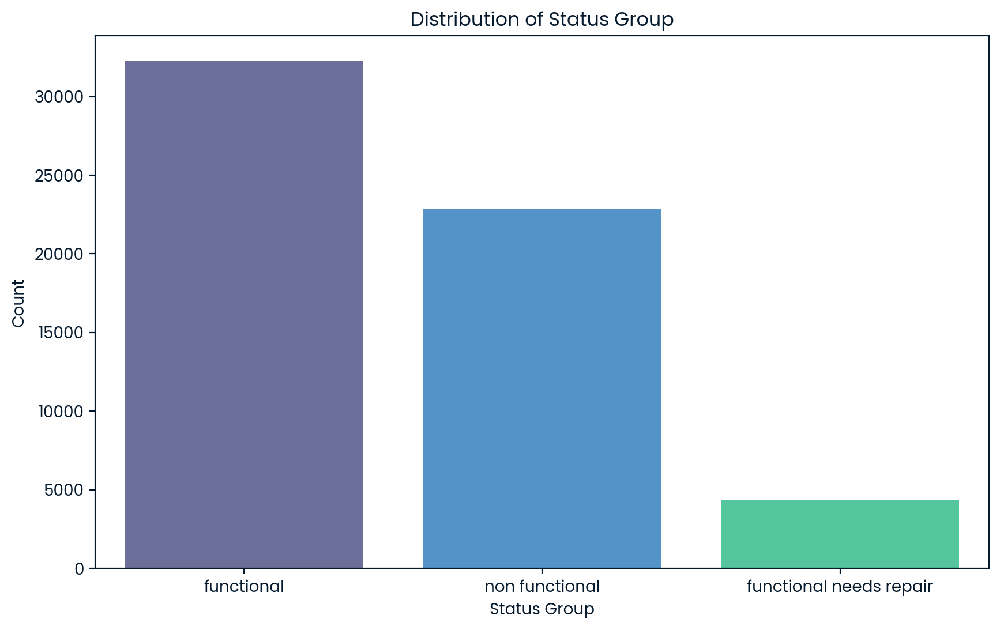

In [10]:
# Plot the distribution of 'status_group'
plt.figure(figsize=(10, 6))
sns.countplot(data=train_df, x='status_group', hue='status_group', hue_order=status_order)

plt.title('Distribution of Status Group')
plt.xlabel('Status Group')
plt.ylabel('Count')

plt.show()

In [11]:
# Separate train_df into numeric and categorical variables
numeric_columns = train_df.select_dtypes(include=['number']).columns.tolist()
categorical_columns = train_df.select_dtypes(include=['object']).columns.tolist()

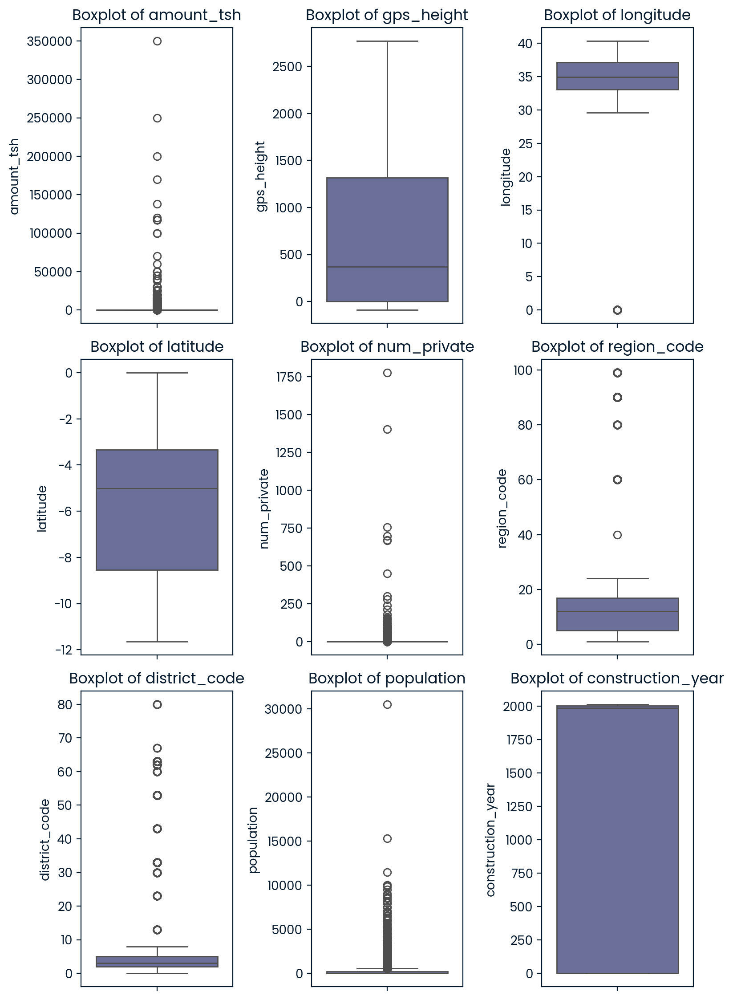

In [12]:
# Remove 'id' column
numeric_columns = [col for col in numeric_columns if col != 'id']

# Create boxplot distributions of all columns in numeric_columns
plt.figure(figsize=(8, 15))

for i, col in enumerate(numeric_columns):
    plt.subplot(len(numeric_columns) // 3 + 1, 3, i + 1)
    sns.boxplot(data=train_df, y=col)
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()

plt.show()

# Going Through the Features

Yes, we are going to go through them all because... I'm suppose to?

Aside from `construction_year`, I will follow the order from the data dictionary.

In [13]:
# Define the order for 'status_group'
status_order = ['functional', 'functional needs repair', 'non functional']

### Construction Year

Looked at `construction_year` column and found 0's instead of 'na' values. This affects the distribution, so convert to 'na' values.

~35% of values in `construction_year` are now 'na'.

In [14]:
# Change all values of 0 in 'construction_year' to NaN
train_df['construction_year'] = train_df['construction_year'].replace(0, np.nan)

It's taking forever on my laptop to process the dataset, so we will take a smaller sample.

Let's try 10%.

In [15]:
# Perform stratified sampling to get 10% of the data
sample_df, _ = train_test_split(train_df, test_size=0.9, stratify=train_df['status_group'], random_state=604)

# Display the shape of the sampled dataframe to verify
sample_df.shape

(5940, 41)

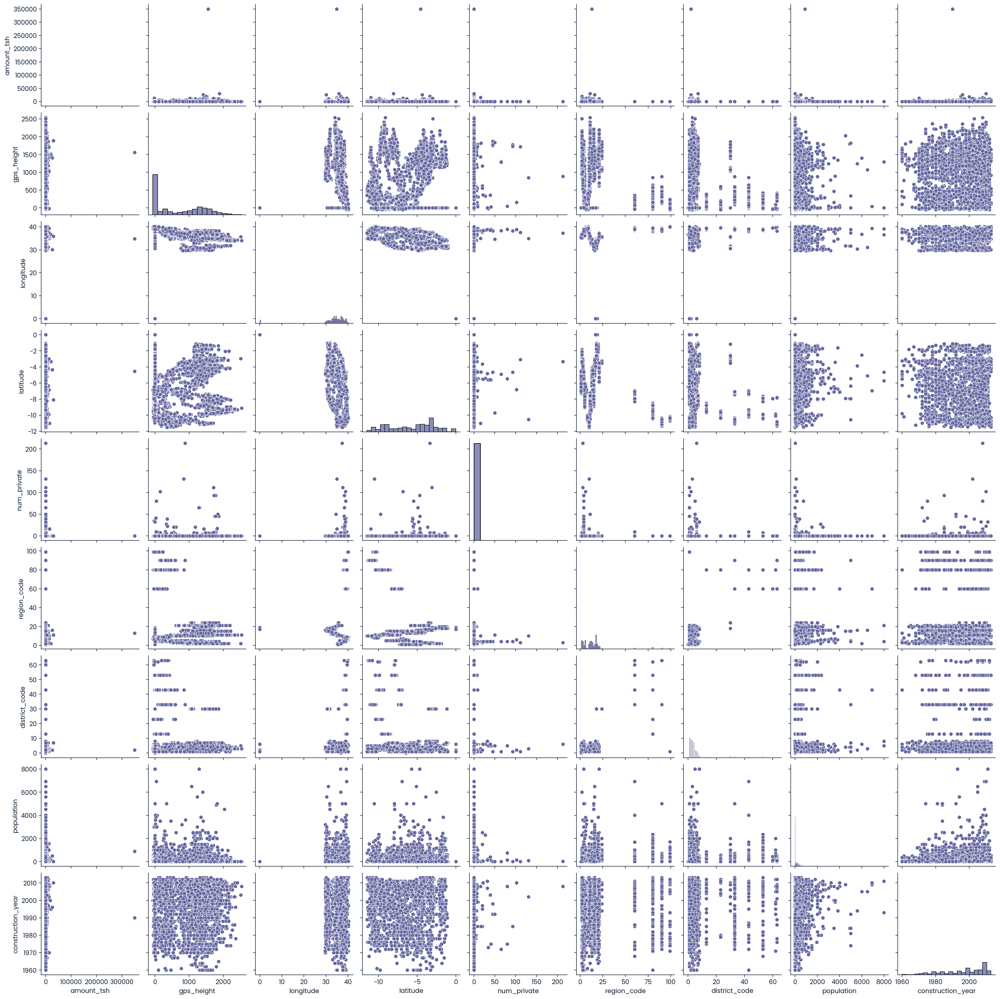

In [16]:
# Pairplot of numeric_columns (with sample_df otherwise will take forever)
sns.pairplot(sample_df[numeric_columns])
plt.show()

### Total Static Head
`amount_tsh` is interesting because I cannot infer units. For example, the max value is 350,000.

If that was in meters, that would be about 40 times the height of Mount Everest.

The other problem is that there are functional pumps where `amount_tsh` is 0.

In [17]:
# Maximum value of 'amount_tsh'
train_df['amount_tsh'].max()

350000.0

In [18]:
# Count the number of times amount_tsh is 0 where status_group is 'functional'
train_df[(train_df['status_group'] == 'functional') & (train_df['amount_tsh'] == 0)].shape[0]

19706

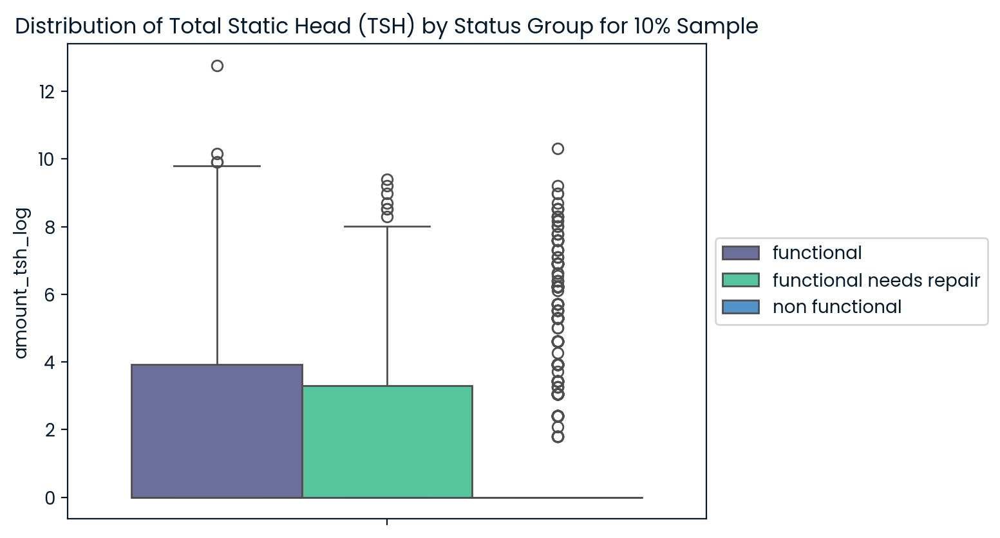

In [19]:
# Log transform 'amount_tsh' and create a new column 'amount_tsh_log'
sample_df['amount_tsh_log'] = np.log1p(sample_df['amount_tsh'])

# Create a boxplot of the log-transformed 'amount_tsh'
sns.boxplot(data=sample_df, y='amount_tsh_log', hue='status_group')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Distribution of Total Static Head (TSH) by Status Group for 10% Sample')
plt.show()

### Date Recorded
Date Recorded seems to fall within a 2 year period with dates recorded more at the beginning of each year.

May not be a useful feature.

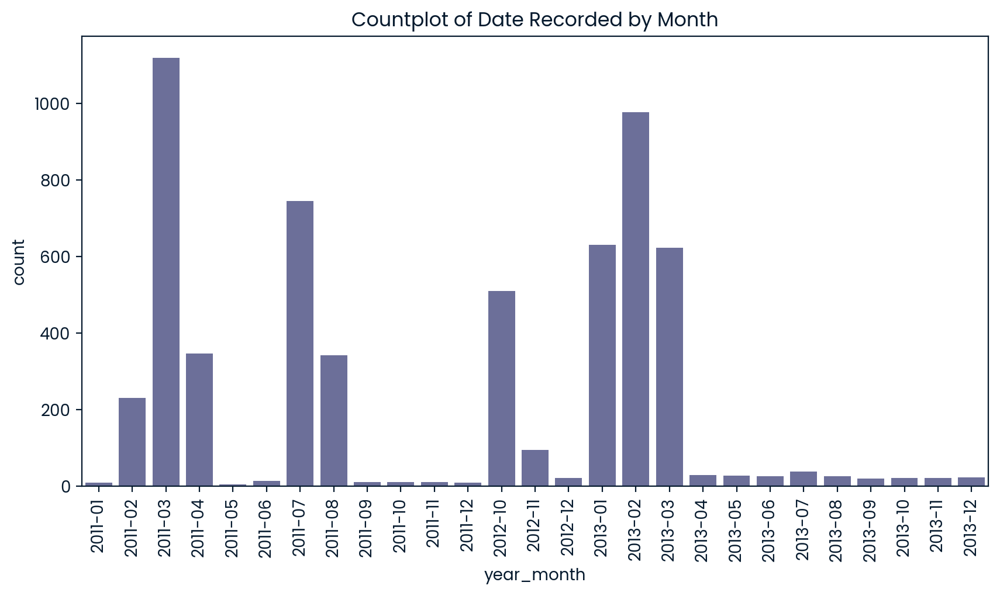

In [20]:
# Look at 'date_recorded'
# Convert 'date_recorded' to pandas datetime
sample_df['date_recorded'] = pd.to_datetime(sample_df['date_recorded'])

# Extract month and year from 'date_recorded'
sample_df['year_month'] = sample_df['date_recorded'].dt.to_period('M')

# Create a countplot of the timeline by month and sort by date
plt.figure(figsize=(10, 5))
sns.countplot(data=sample_df, x='year_month', order=sorted(sample_df['year_month'].unique()))
plt.xticks(rotation=90)
plt.title('Countplot of Date Recorded by Month')
plt.show()

### Funder
There appears to be a lot of funders, but most of them are from the Government of Tanzania.

There also appears to be a lot of null values, in addition to '0'. Let's combine them as missing values.

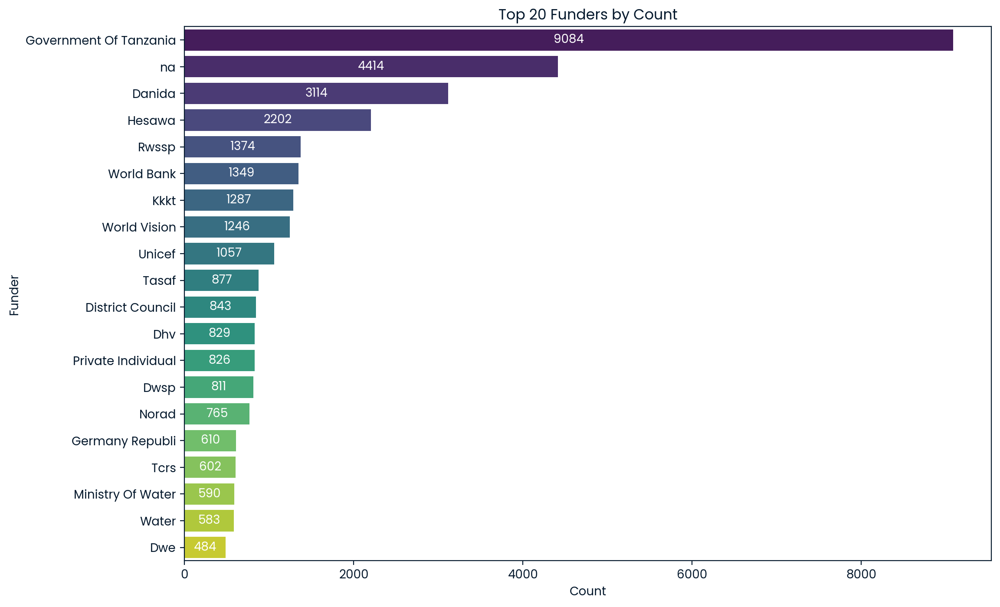

In [21]:
# Convert '0' to na in 'funder' and fillna with 'na'
train_df['funder'] = train_df['funder'].replace('0', np.nan).fillna('na')

# Get the top 20 funders by count, including 'na'
top_funders = train_df['funder'].value_counts().head(20)

# Create a bar plot for the top 20 funders
plt.figure(figsize=(12, 8))
sns.barplot(x=top_funders.values, y=top_funders.index, palette='viridis')
plt.title('Top 20 Funders by Count')
plt.xlabel('Count')
plt.ylabel('Funder')

# Annotate the number of funders in the middle of the bar in white
for index, value in enumerate(top_funders.values):
    plt.text(value / 2, index, str(value), color='white', ha='center', va='center')

plt.show()

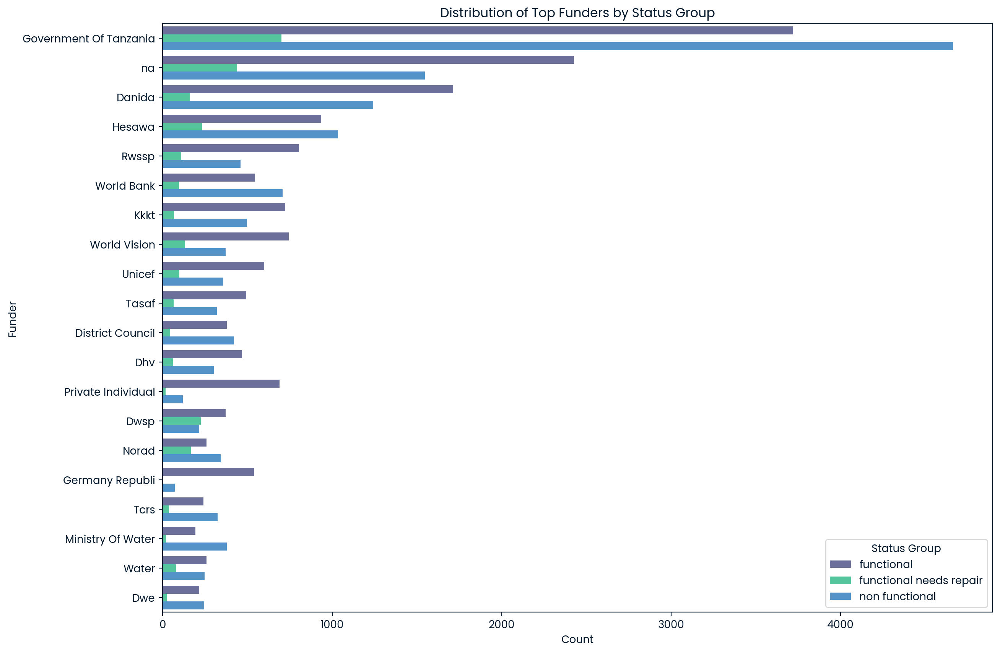

In [22]:
# Make a list of names in top_funders
top_funders_list = top_funders.index.tolist()

# Filter the dataframe to include only rows where 'funder' is in top_funders_list
filtered_df = train_df[train_df['funder'].isin(top_funders_list)]

# Create a countplot of 'funder' by 'status_group'
plt.figure(figsize=(14, 10))
sns.countplot(data=filtered_df, y='funder', hue='status_group', order=top_funders_list, hue_order=status_order)
plt.title('Distribution of Top Funders by Status Group')
plt.xlabel('Count')
plt.ylabel('Funder')
plt.legend(title='Status Group')
plt.show()

### GPS Height
A quick look at the distribution shows a lot of 0's and some negative values.

This can be appropriate if we assume 0 is at sea level, and negative values are below sea level.

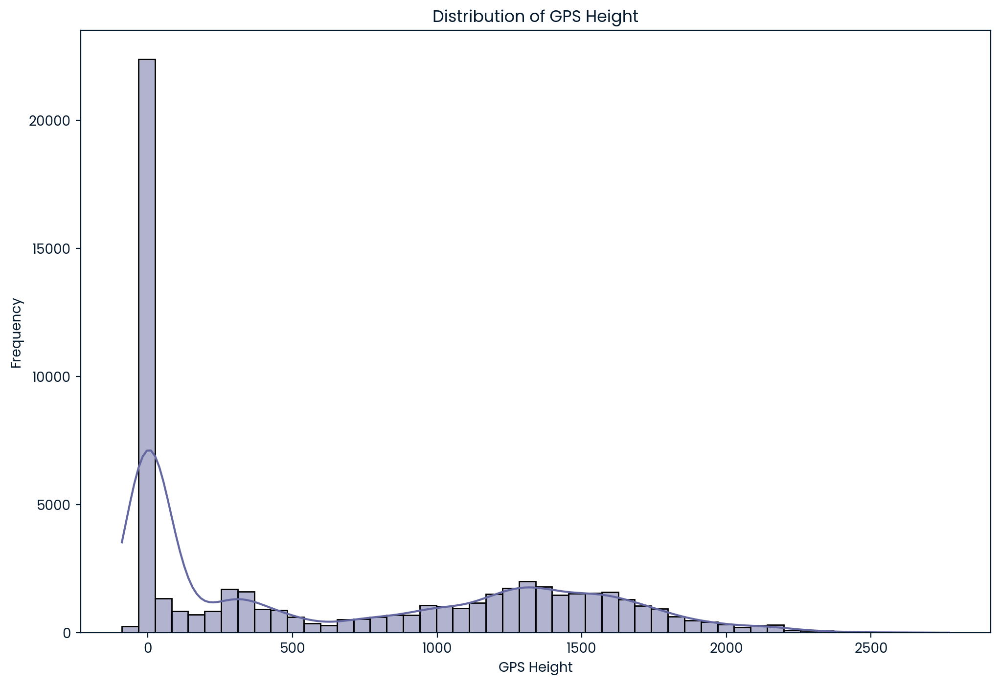

In [23]:
# Visualize the distribution of GPS height
plt.figure(figsize=(12, 8))
sns.histplot(train_df['gps_height'], bins=50, kde=True)
plt.title('Distribution of GPS Height')
plt.xlabel('GPS Height')
plt.ylabel('Frequency')

plt.show()

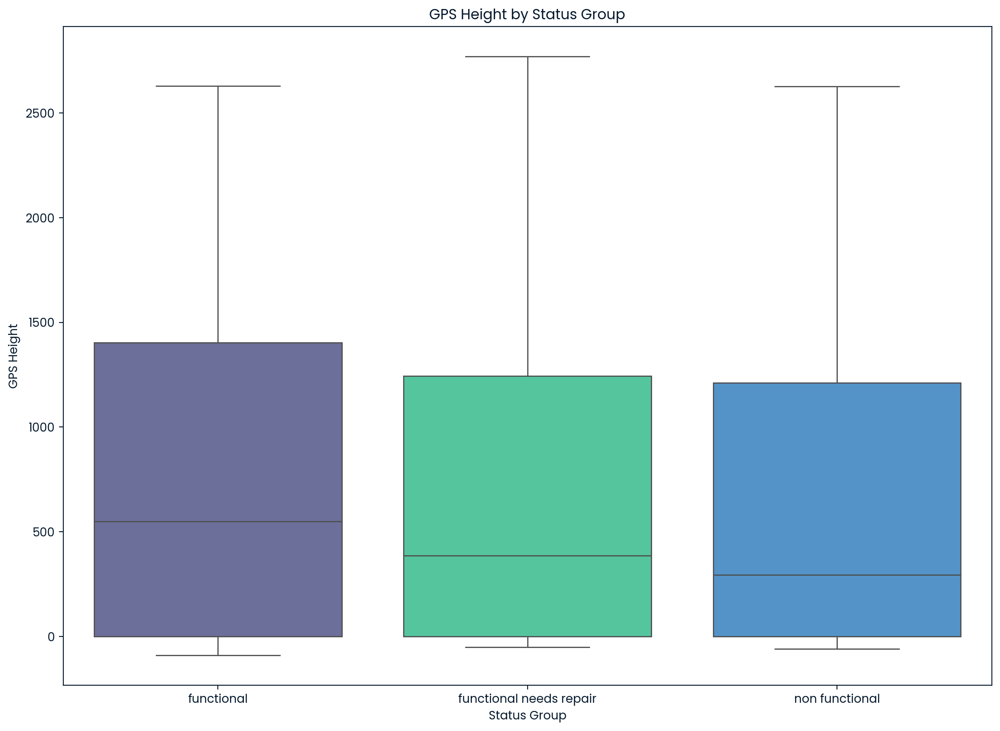

In [24]:
# Create a boxplot to visualize GPS height by status_group
plt.figure(figsize=(14, 10))
sns.boxplot(data=train_df, x='status_group', y='gps_height', order=status_order, hue='status_group', hue_order=status_order)
plt.title('GPS Height by Status Group')
plt.xlabel('Status Group')
plt.ylabel('GPS Height')
plt.show()

### Installer

Similar to `funders`. There are missing values and also a '0', so convert to na and chart.

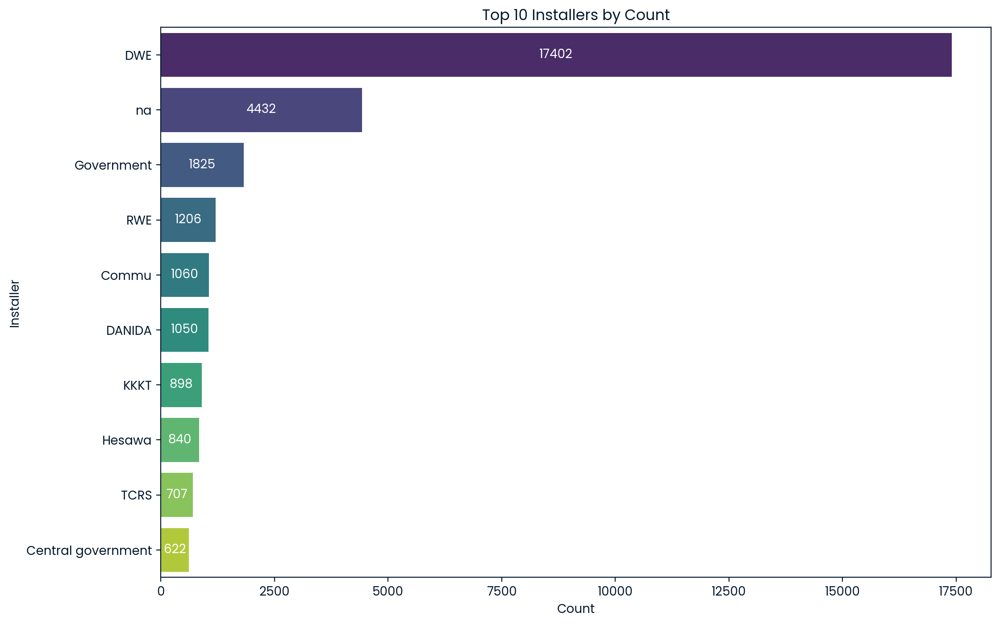

In [25]:
# Convert '0' to na in 'installer' and fillna with 'na'
train_df['installer'] = train_df['installer'].replace('0', np.nan).fillna('na')

# Get the top 10 installers by count, including 'na'
top_installers = train_df['installer'].value_counts().head(10)

# Create a bar plot for the top installers
plt.figure(figsize=(12, 8))
sns.barplot(x=top_installers.values, y=top_installers.index, palette='viridis')
plt.title('Top 10 Installers by Count')
plt.xlabel('Count')
plt.ylabel('Installer')

# Annotate the number of installer in the middle of the bar in white
for index, value in enumerate(top_installers.values):
    plt.text(value / 2, index, str(value), color='white', ha='center', va='center')

plt.show()

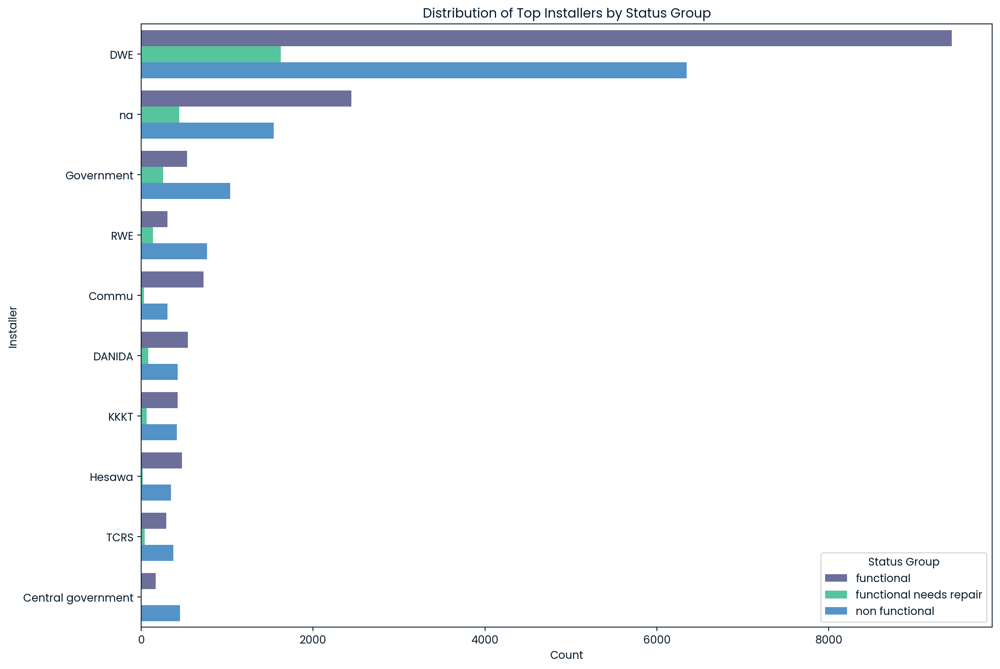

In [26]:
# Make a list of names in top_installers
top_installers_list = top_installers.index.tolist()

# Filter the dataframe to include only rows where 'installer' is in top_installers_list
filtered_df2 = train_df[train_df['installer'].isin(top_installers_list)]

# Create a countplot of 'installer' by 'status_group'
plt.figure(figsize=(14, 10))
sns.countplot(data=filtered_df2, y='installer', hue='status_group', order=top_installers_list, hue_order=status_order)
plt.title('Distribution of Top Installers by Status Group')
plt.xlabel('Count')
plt.ylabel('Installer')
plt.legend(title='Status Group')
plt.show()

### Longitude & Latitude
Let's try to look at things on a map!

There appear to be 0,0 coordinates, which is in the middle of the Atlantic Ocean.

Let's assume that they are unknown locations of the wells and convert to NA

In [27]:
pip install geopandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


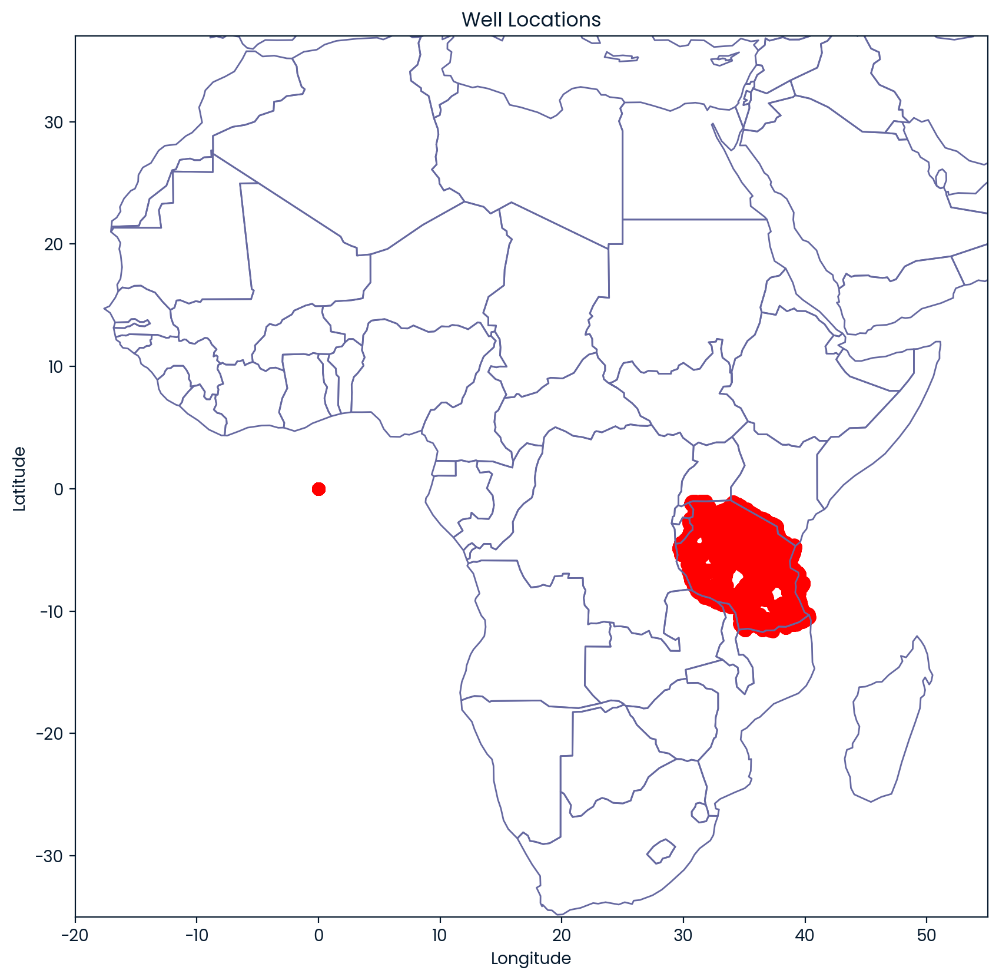

In [28]:
import geopandas as gpd
from shapely.geometry import Point

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(train_df, geometry=gpd.points_from_xy(train_df['longitude'], train_df['latitude']))

# Plot the points
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Ensure the world map and points are in the same coordinate reference system (CRS)
gdf.crs = world.crs

# Plot
fig, ax = plt.subplots(figsize=(10, 10))
world.boundary.plot(ax=ax, linewidth=1)
gdf.plot(ax=ax, color='red', markersize=50)

# Set the x and y axis limits to zoom into Africa
ax.set_xlim(-20, 55)  # Longitude range for Africa
ax.set_ylim(-35, 37)  # Latitude range for Africa

plt.title('Well Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

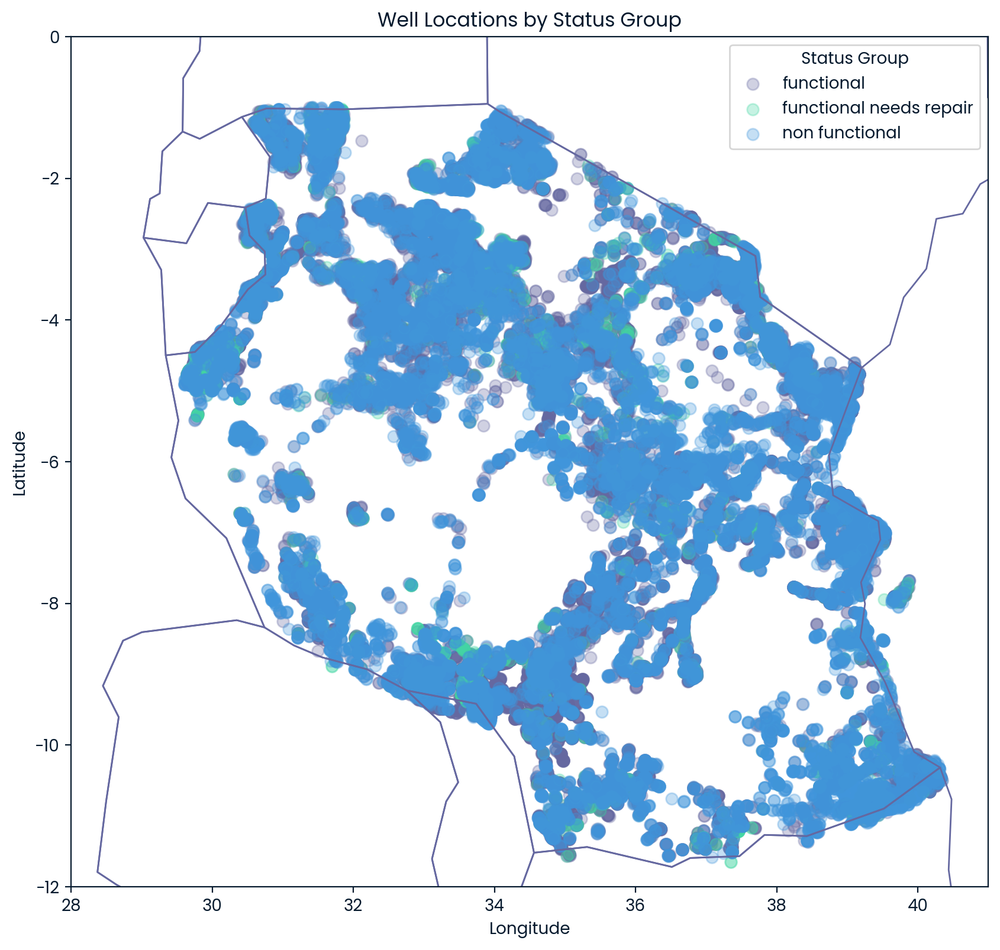

In [29]:
# Zoom In
fig, ax = plt.subplots(figsize=(10, 10))
world.boundary.plot(ax=ax, linewidth=1)

# Plot points with different colors based on 'status_group'
status_groups = status_order
colors = sns.color_palette(None, len(status_groups))

for status, color in zip(status_groups, colors):
    subset = gdf[gdf['status_group'] == status]
    subset.plot(ax=ax, color=color, markersize=50, label=status, alpha=0.3)

# Set the x and y axis limits to zoom into Africa
ax.set_xlim(28, 41)  # Longitude range for Africa
ax.set_ylim(-12, 0)  # Latitude range for Africa

plt.title('Well Locations by Status Group')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Status Group')
plt.show()

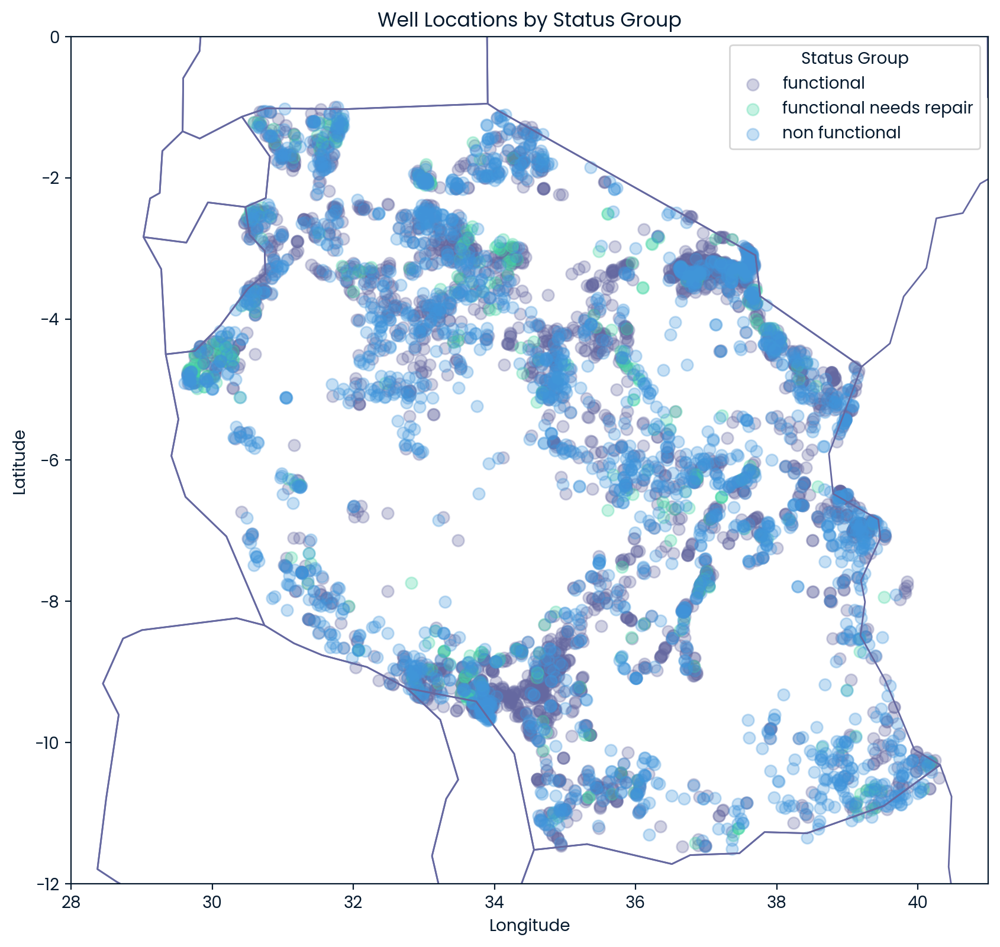

In [30]:
# Zoom In & Use 'sample_df'
fig, ax = plt.subplots(figsize=(10, 10))
world.boundary.plot(ax=ax, linewidth=1)

# Plot points with different colors based on 'status_group'
colors = sns.color_palette(None, len(status_groups))

for status, color in zip(status_groups, colors):
    subset = sample_df[sample_df['status_group'] == status]
    ax.scatter(subset['longitude'], subset['latitude'], color=color, s=50, label=status, alpha=0.3)

# Set the x and y axis limits to zoom into Africa
ax.set_xlim(28, 41)  # Longitude range for Africa
ax.set_ylim(-12, 0)  # Latitude range for Africa

plt.title('Well Locations by Status Group')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Status Group')
plt.show()

In [31]:
# Find rows where longitude OR latitude in train_df are both 0
zero_coordinates = train_df[(train_df['longitude'] == 0) | (train_df['latitude'] == 0)]

# Display # rows with zero coordinates
zero_coordinates.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
21,6091,0.0,2013-02-10,Dwsp,0,DWE,0.0,-2.000000e-08,Muungano,0,Lake Victoria,Ibabachegu,Shinyanga,17,1,Bariadi,Ikungulyabashashi,0,NaN,GeoData Consultants Ltd,WUG,NaN,False,NaN,swn 80,swn 80,handpump,wug,user-group,unknown,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump,functional
53,32376,0.0,2011-08-01,Government Of Tanzania,0,Government,0.0,-2.000000e-08,Polisi,0,Lake Victoria,Center,Mwanza,19,6,Geita,Nyang'hwale,0,True,GeoData Consultants Ltd,VWC,Nyang'hwale,True,NaN,submersible,submersible,submersible,vwc,user-group,unknown,unknown,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
168,72678,0.0,2013-01-30,Wvt,0,WVT,0.0,-2.000000e-08,Wvt Tanzania,0,Lake Victoria,Ilula,Shinyanga,17,1,Bariadi,Chinamili,0,False,GeoData Consultants Ltd,Parastatal,NaN,False,NaN,gravity,gravity,gravity,parastatal,parastatal,other,other,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
177,56725,0.0,2013-01-17,Netherlands,0,DWE,0.0,-2.000000e-08,Kikundi Cha Wakina Mama,0,Lake Victoria,Mahaha,Shinyanga,17,1,Bariadi,Bunamhala,0,NaN,GeoData Consultants Ltd,WUG,NaN,False,NaN,other,other,other,wug,user-group,unknown,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,other,other,non functional
253,13042,0.0,2012-10-29,Hesawa,0,DWE,0.0,-2.000000e-08,Kwakisusi,0,Lake Victoria,Nyamatala,Mwanza,19,2,Magu,Malili,0,True,GeoData Consultants Ltd,NaN,NaN,True,NaN,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional needs repair


In [32]:
# Convert 'longitude' values of 0 to NaN
train_df.loc[train_df['longitude'] == 0, 'longitude'] = np.nan

# Convert 'latitude' values of -2e-8 to NaN
train_df.loc[train_df['latitude'] == -2e-8, 'latitude'] = np.nan

### Waterpoint Name `wpt_name`

From ChatGPT 4o: A waterpoint is a designated location where water is made available for public use, typically in rural or peri-urban areas. These points are crucial for communities that do not have direct access to water within their homes.

Probably not a useful feature.

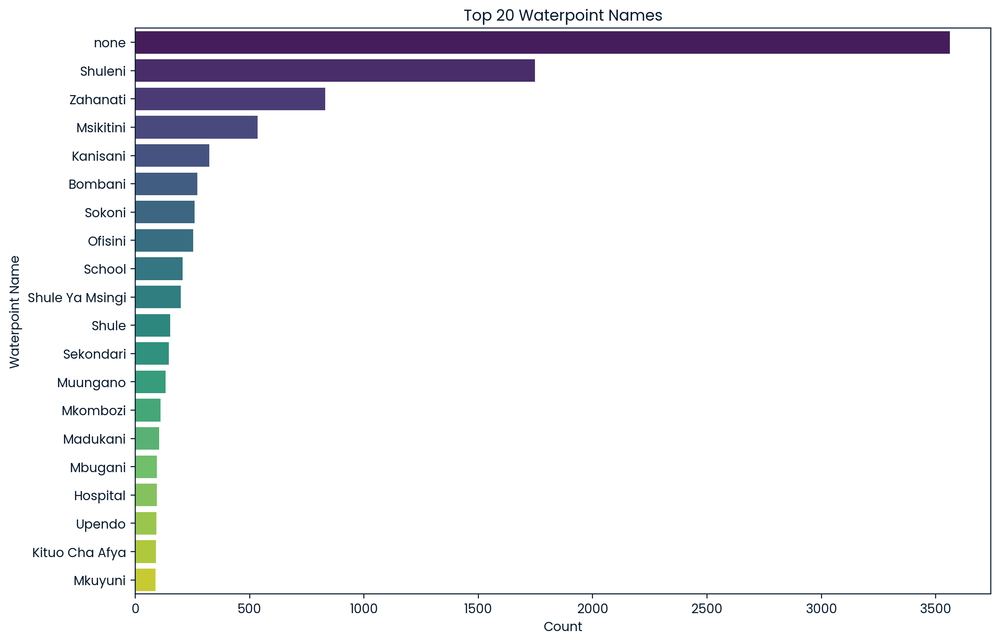

In [9]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Count the occurrences of each waterpoint name
wpt_name_counts = train_df['wpt_name'].value_counts().head(20)  # Display top 20 for readability

# Create a bar plot
sns.barplot(x=wpt_name_counts.values, y=wpt_name_counts.index, palette='viridis')

# Set the title and labels
plt.title('Top 20 Waterpoint Names')
plt.xlabel('Count')
plt.ylabel('Waterpoint Name')

# Show the plot
plt.show()

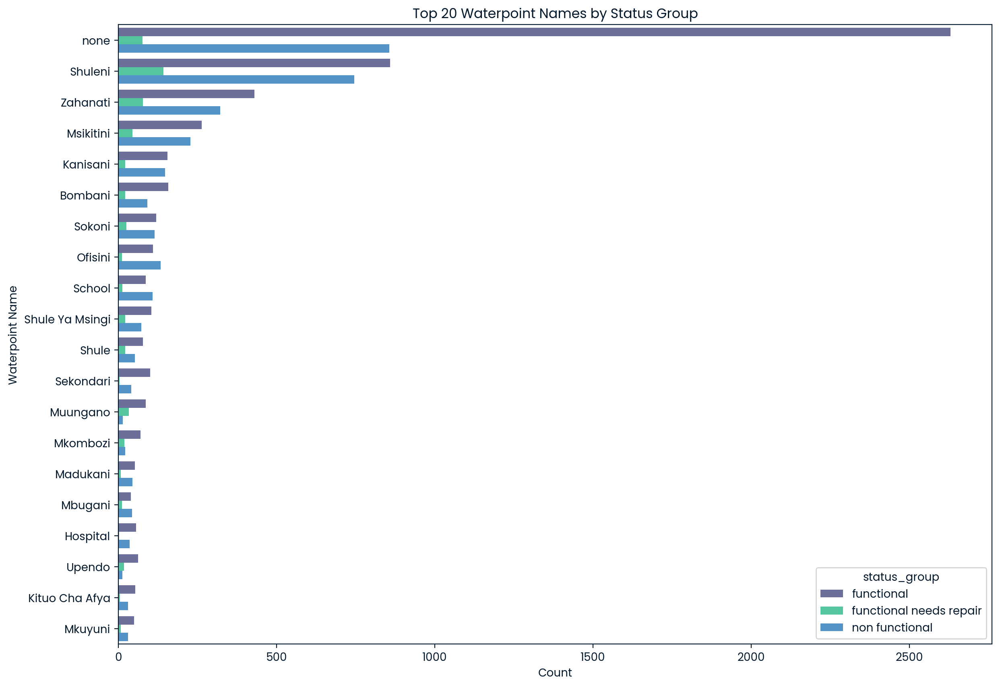

In [34]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'wpt_name' by 'status_group'
sns.countplot(y='wpt_name', hue='status_group', data=train_df, order=train_df['wpt_name'].value_counts().iloc[:20].index,
              hue_order=status_groups)

# Set the title and labels
plt.title('Top 20 Waterpoint Names by Status Group')
plt.xlabel('Count')
plt.ylabel('Waterpoint Name')

# Show the plot
plt.show()

### `num_private`?

Mostly 0s, and some other random numbers. With no other information, we will drop this column.

### Geographic Locations
- `basin` - Geographic water basin
    - 9 categories
- `subvillage` - Geographic location
    - Some subvillages only contain a single letter or number, but not a big deal. Missing values as well, but we can leave them.
- `region` - Geographic location
- `region_code` - Geographic location (coded)
    - Perform categorical encoding so there won't be numerical pattern matching (i.e. Region 2 > Region 1)
- `district_code` - Geographic location (coded)
    - Perform categorical encoding
- `lga` - Geographic location
- `ward` - Geographic location

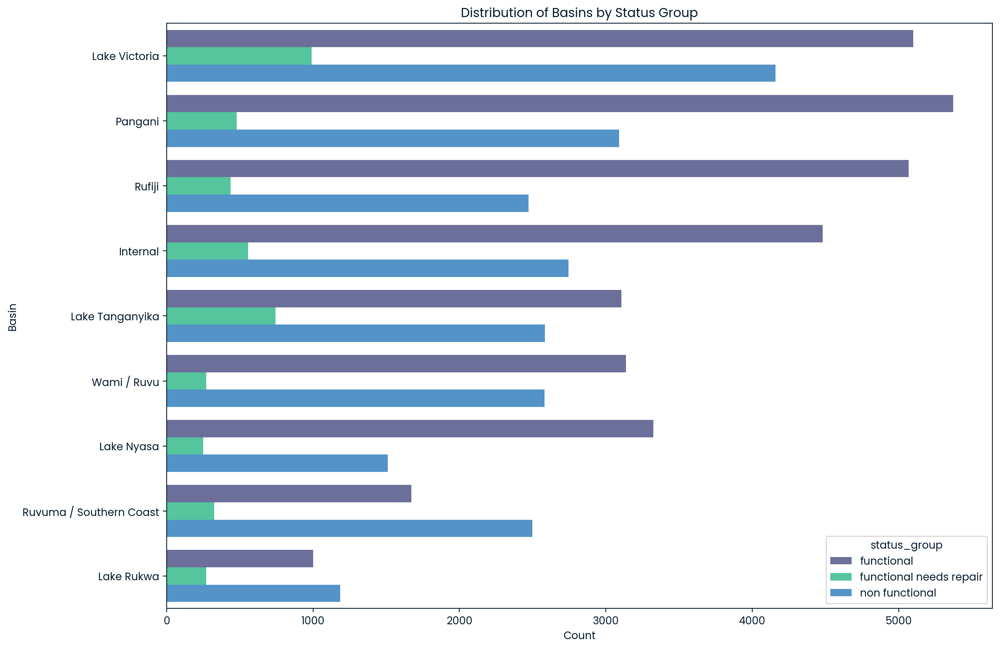

In [35]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'basin' by 'status_group'
sns.countplot(y='basin', hue='status_group', data=train_df, order=train_df['basin'].value_counts().index,
              hue_order=status_groups)

# Set the title and labels
plt.title('Distribution of Basins by Status Group')
plt.xlabel('Count')
plt.ylabel('Basin')

# Show the plot
plt.show()

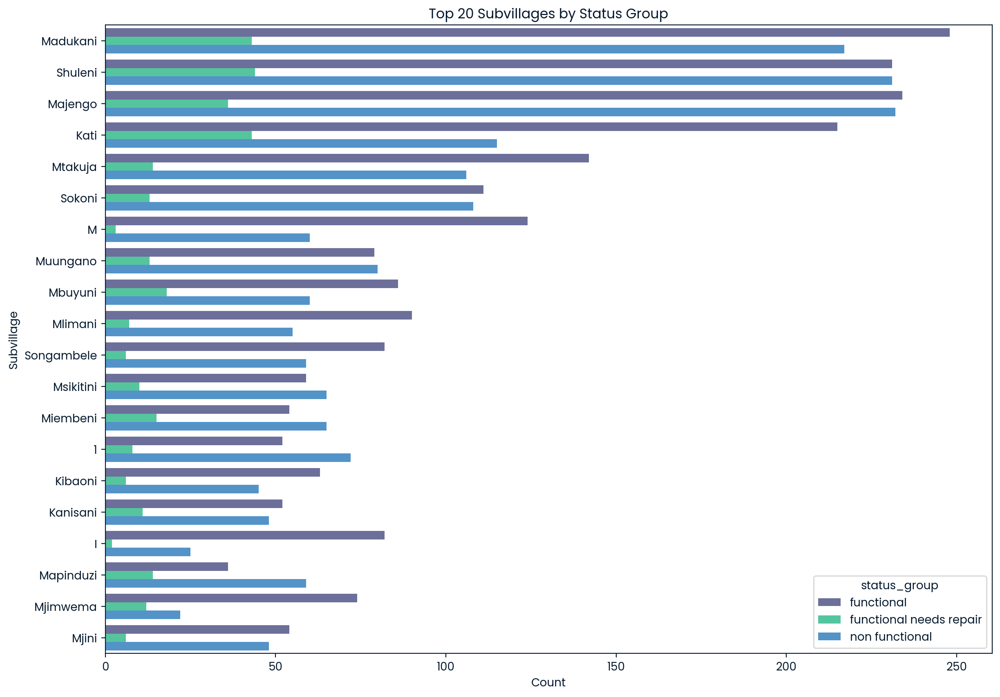

In [36]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'subvillage' by 'status_group'
sns.countplot(y='subvillage', hue='status_group', data=train_df, order=train_df['subvillage'].value_counts().iloc[:20].index,
              hue_order=status_groups)

# Set the title and labels
plt.title('Top 20 Subvillages by Status Group')
plt.xlabel('Count')
plt.ylabel('Subvillage')

# Show the plot
plt.show()

In [37]:
# Find subvillages that only contain 1 letter
one_letter_subvillages = train_df[train_df['subvillage'].str.len() == 1]['subvillage'].unique()

# Display the result
one_letter_subvillages

array(['J', 'I', 'M', 'S', 'K', 'L', '1', 'U', 'T', 'N', 'C', 'F', 'A',
       'G', 'W', 'P', 'R', 'O', 'Q', 'B'], dtype=object)

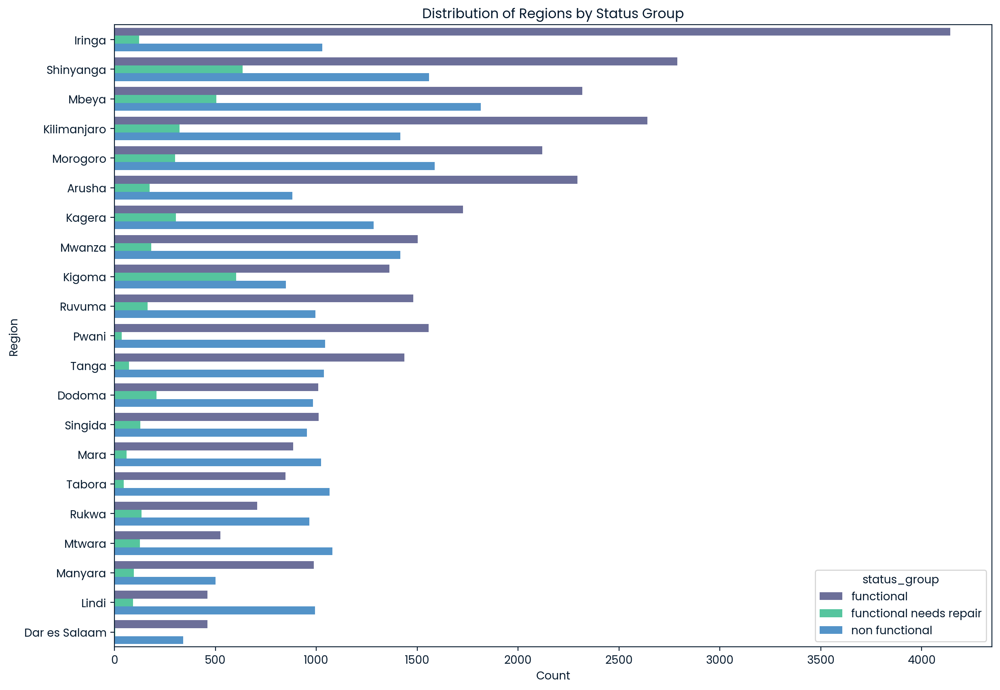

In [38]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'region' by 'status_group'
sns.countplot(y='region', hue='status_group', data=train_df, order=train_df['region'].value_counts().index,
              hue_order=status_groups)

# Set the title and labels
plt.title('Distribution of Regions by Status Group')
plt.xlabel('Count')
plt.ylabel('Region')

# Show the plot
plt.show()

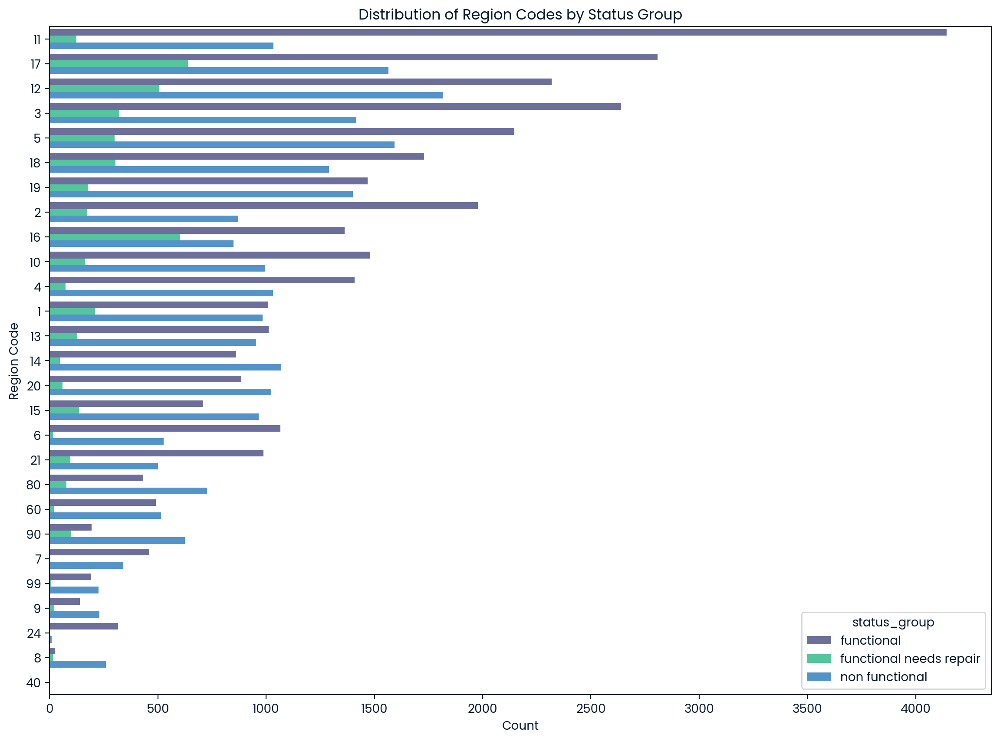

In [39]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'region_code' by 'status_group'
sns.countplot(y='region_code', hue='status_group', data=train_df, order=train_df['region_code'].value_counts().index,
              hue_order=status_groups)

# Set the title and labels
plt.title('Distribution of Region Codes by Status Group')
plt.xlabel('Count')
plt.ylabel('Region Code')

# Show the plot
plt.show()

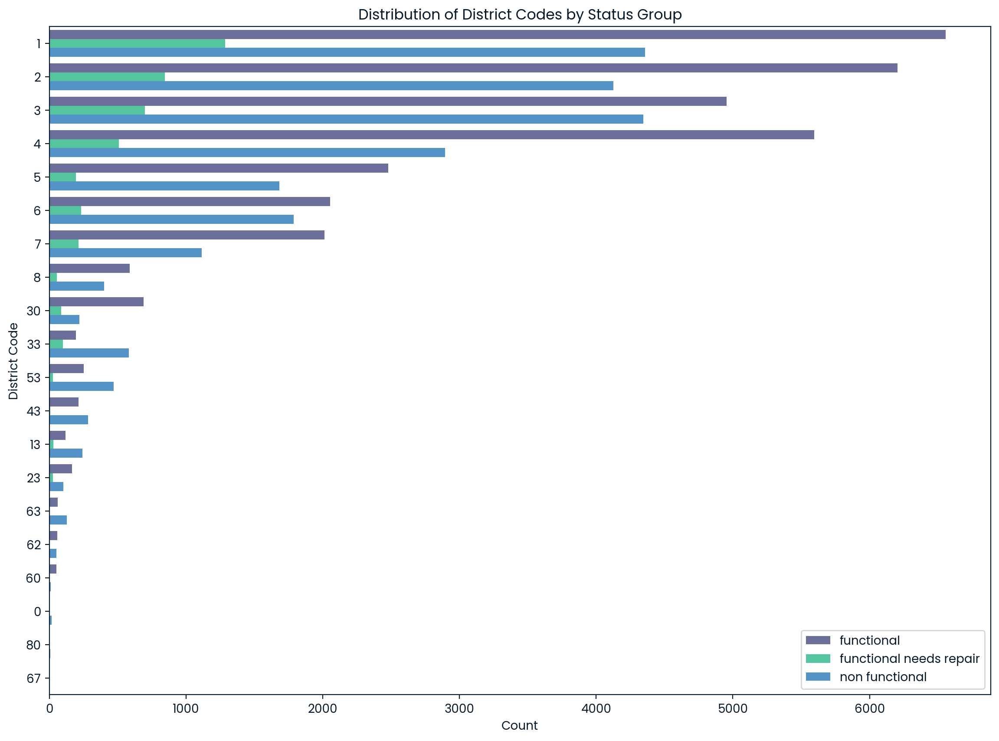

In [40]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'district_code' by 'status_group'
sns.countplot(y='district_code', hue='status_group', data=train_df, order=train_df['district_code'].value_counts().index,
              hue_order=status_groups)

# Set the title and labels
plt.title('Distribution of District Codes by Status Group')
plt.xlabel('Count')
plt.ylabel('District Code')

# Move the legend to the bottom right
plt.legend(loc='lower right')

# Show the plot
plt.show()

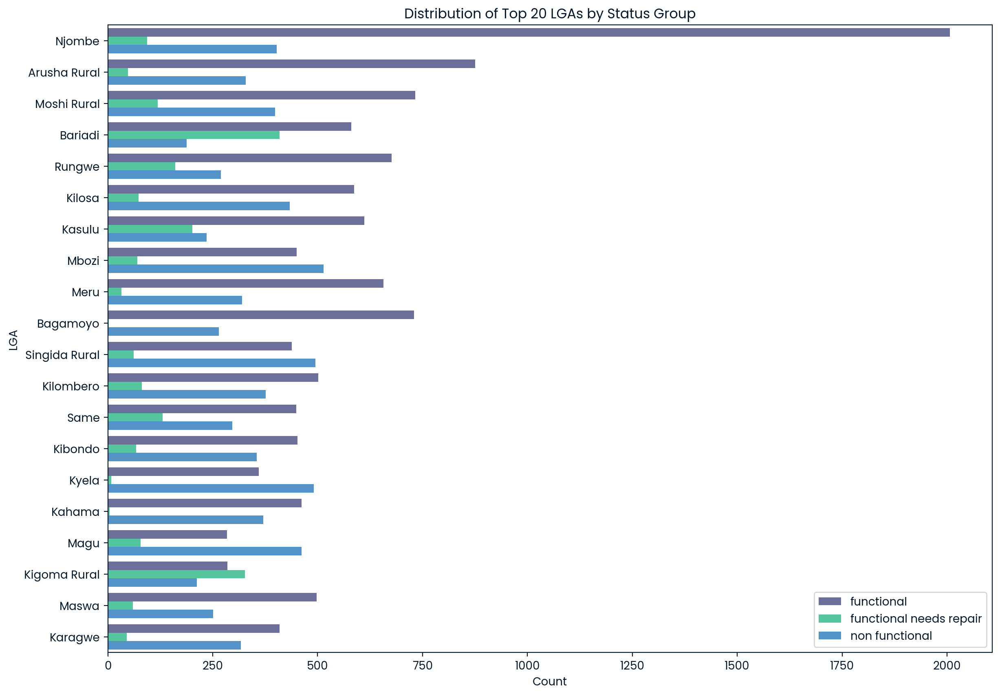

In [41]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Get the top 20 LGAs by count
top_20_lgas = train_df['lga'].value_counts().nlargest(20).index

# Create a count plot for the top 20 'lga' by 'status_group'
sns.countplot(y='lga', hue='status_group', data=train_df[train_df['lga'].isin(top_20_lgas)], 
              order=top_20_lgas, hue_order=status_groups)

# Set the title and labels
plt.title('Distribution of Top 20 LGAs by Status Group')
plt.xlabel('Count')
plt.ylabel('LGA')

# Move the legend to the bottom right
plt.legend(loc='lower right')

# Show the plot
plt.show()

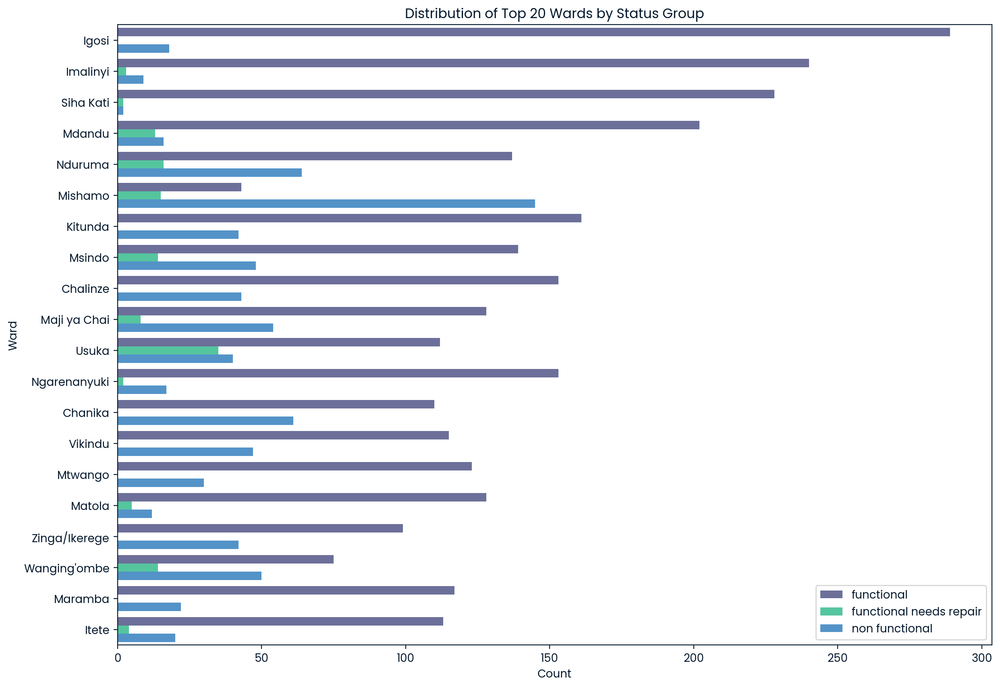

In [42]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Get the top 20 Wards by count
top_20_wards = train_df['ward'].value_counts().nlargest(20).index

# Create a count plot for the top 20 'ward' by 'status_group'
sns.countplot(y='ward', hue='status_group', data=train_df[train_df['ward'].isin(top_20_wards)], 
              order=top_20_wards, hue_order=status_groups)

# Set the title and labels
plt.title('Distribution of Top 20 Wards by Status Group')
plt.xlabel('Count')
plt.ylabel('Ward')

# Move the legend to the bottom right
plt.legend(loc='lower right')

# Show the plot
plt.show()

## Additional Features

- `population` - Population around the well
    - log transform to `population_log` if necessary
- `public_meeting` - True/False **missing values**
- `recorded_by` - Group entering this row of data
    - Only one group, so remove feature
- `scheme_management` - Who operates the waterpoint **missing values**
- `scheme_name` - Who operates the waterpoint **missing values**
- `permit` - If the waterpoint is permitted **missing values**
- `extraction_type` - The kind of extraction the waterpoint uses
- `extraction_type_group` - The kind of extraction the waterpoint uses
- `extraction_type_class` - The kind of extraction the waterpoint uses
- `management` - How the waterpoint is managed
- `management_group` - How the waterpoint is managed

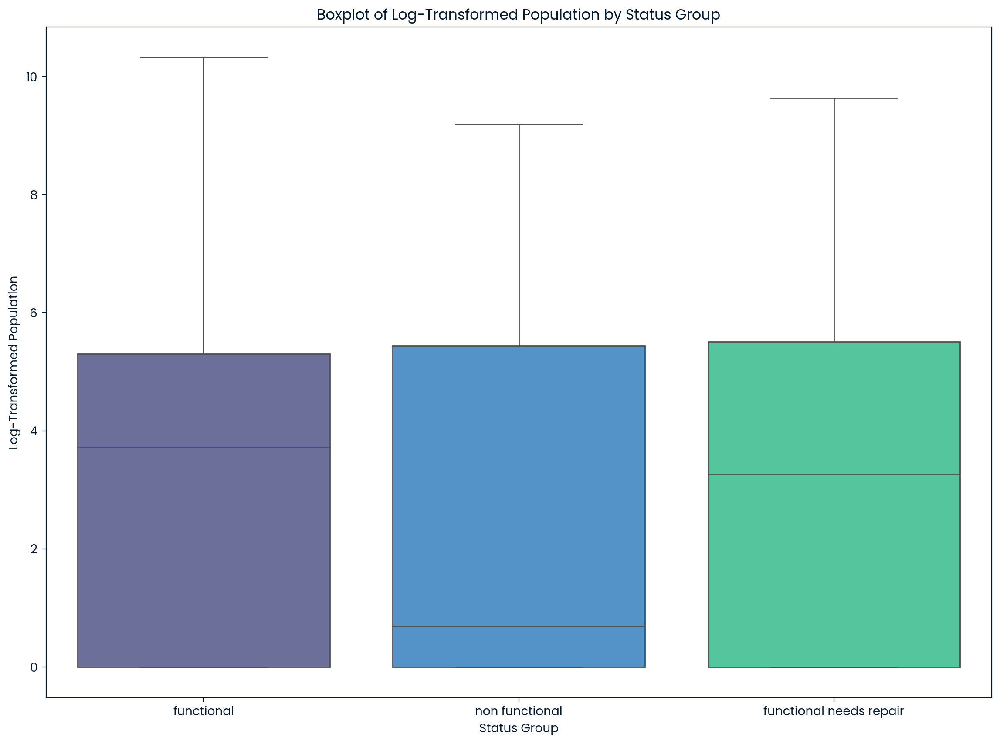

In [43]:
# Log transform the 'population' column
train_df['population_log'] = np.log1p(train_df['population'])

# Set the figure size
plt.figure(figsize=(14, 10))

# Create a box plot for 'population_log' by 'status_group'
sns.boxplot(data=train_df, x='status_group', y='population_log', 
            hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Boxplot of Log-Transformed Population by Status Group')
plt.xlabel('Status Group')
plt.ylabel('Log-Transformed Population')

# Show the plot
plt.show()

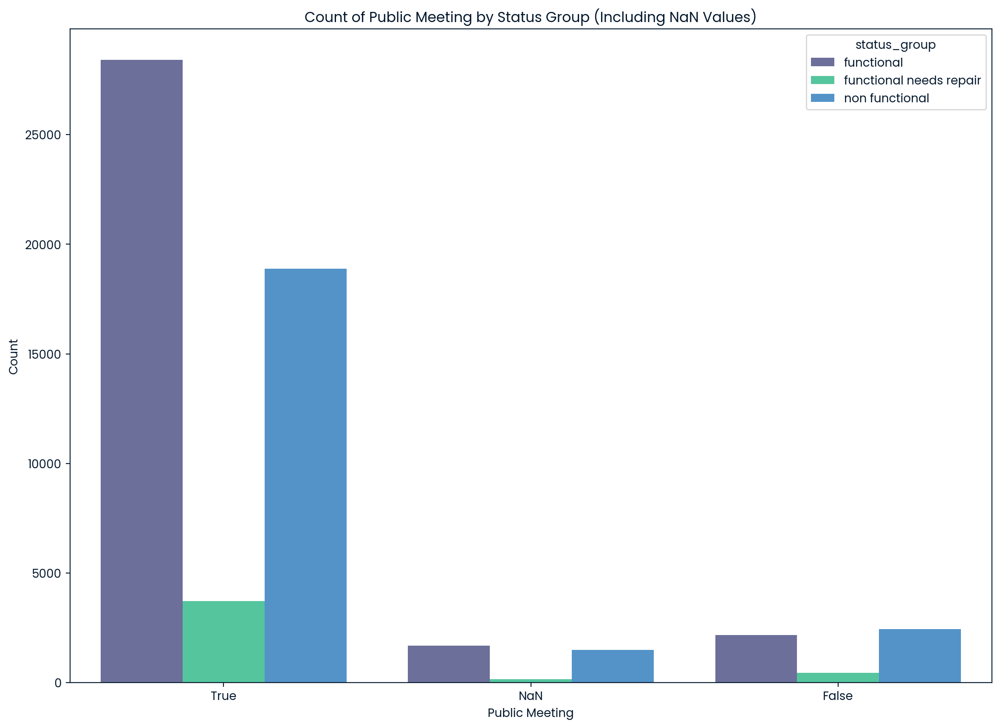

In [44]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a new column to handle NaN values in 'public_meeting'
train_df['public_meeting_nan'] = train_df['public_meeting'].fillna('NaN')

# Create a count plot for 'public_meeting_nan' including NaN values, colored by 'status_group'
sns.countplot(data=train_df, x='public_meeting_nan', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Public Meeting by Status Group (Including NaN Values)')
plt.xlabel('Public Meeting')
plt.ylabel('Count')

# Show the plot
plt.show()

In [45]:
# Only one group recording data; remove feature
train_df['recorded_by'].value_counts()

recorded_by
GeoData Consultants Ltd    59400
Name: count, dtype: int64

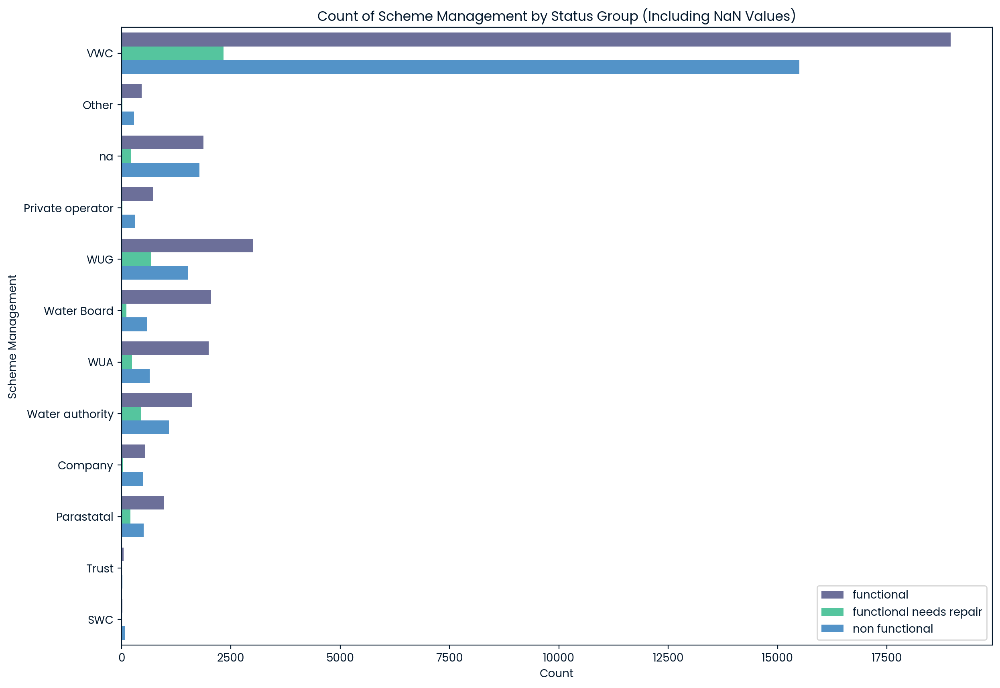

In [51]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a new column to handle NaN values in 'scheme_management'
train_df['scheme_management_nan'] = train_df['scheme_management'].fillna('na')

# Create a count plot for 'scheme_management_nan' colored by 'status_group'
sns.countplot(data=train_df, y='scheme_management_nan', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Scheme Management by Status Group (Including NaN Values)')
plt.xlabel('Count')
plt.ylabel('Scheme Management')
plt.legend(loc='lower right')

# Show the plot
plt.show()

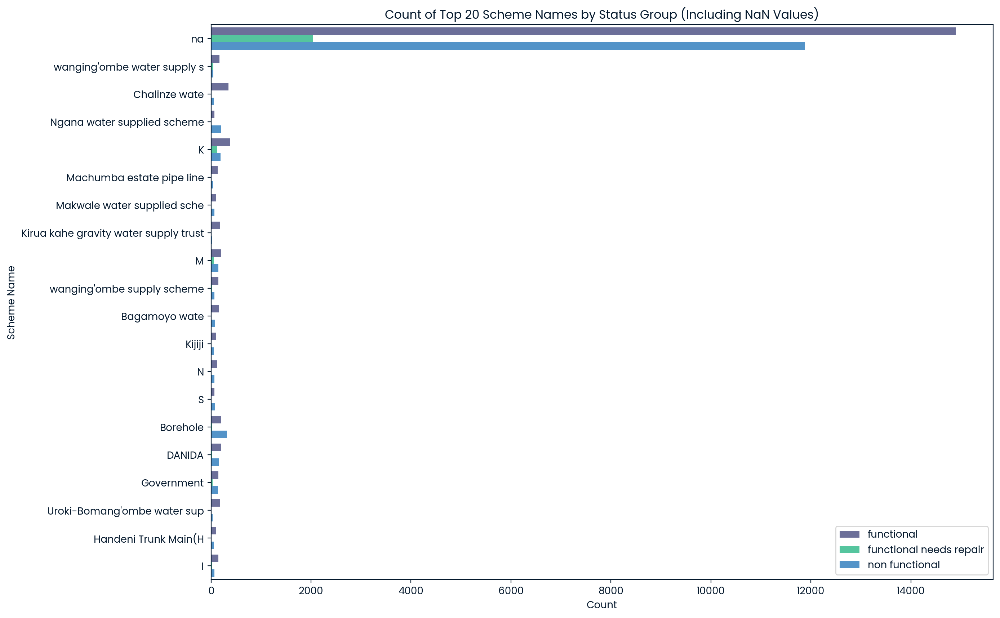

In [53]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a new column to handle NaN values in 'scheme_name'
train_df['scheme_name_nan'] = train_df['scheme_name'].fillna('na')

# Get the top 20 scheme names by count
top_20_scheme_names = train_df['scheme_name_nan'].value_counts().nlargest(20).index

# Filter the dataframe to include only the top 20 scheme names
filtered_df = train_df[train_df['scheme_name_nan'].isin(top_20_scheme_names)]

# Create a count plot for 'scheme_name_nan' colored by 'status_group'
sns.countplot(data=filtered_df, y='scheme_name_nan', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Top 20 Scheme Names by Status Group (Including NaN Values)')
plt.xlabel('Count')
plt.ylabel('Scheme Name')
plt.legend(loc='lower right')

# Show the plot
plt.show()

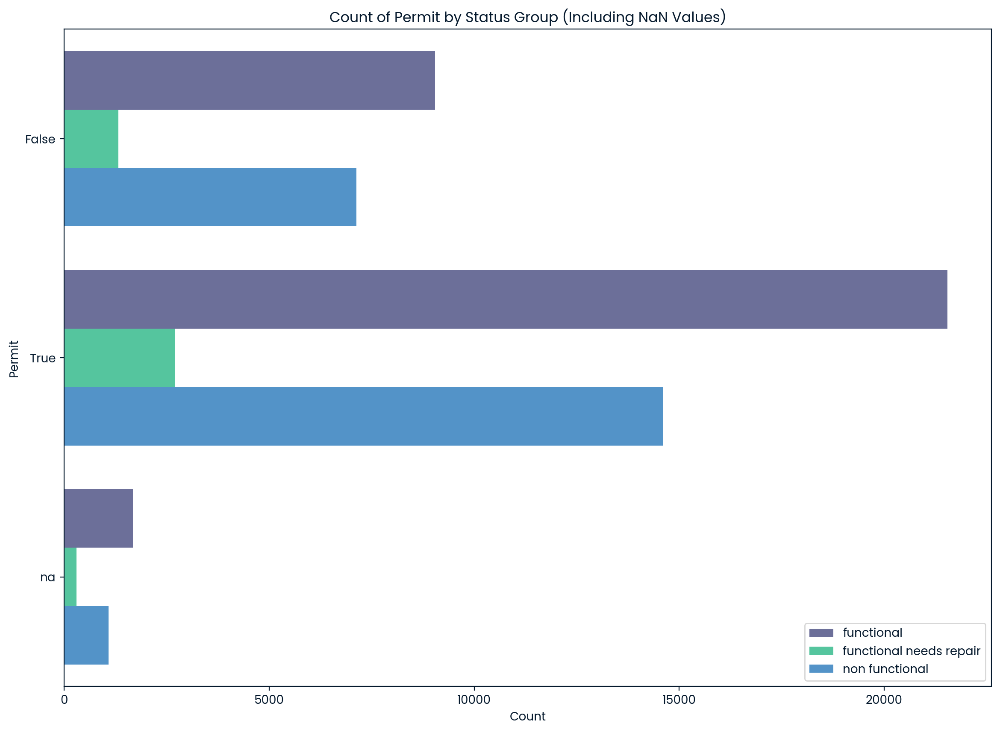

In [54]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a new column to handle NaN values in 'permit'
train_df['permit_nan'] = train_df['permit'].fillna('na')

# Create a count plot for 'permit_nan' colored by 'status_group'
sns.countplot(data=train_df, y='permit_nan', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Permit by Status Group (Including NaN Values)')
plt.xlabel('Count')
plt.ylabel('Permit')
plt.legend(loc='lower right')

# Show the plot
plt.show()

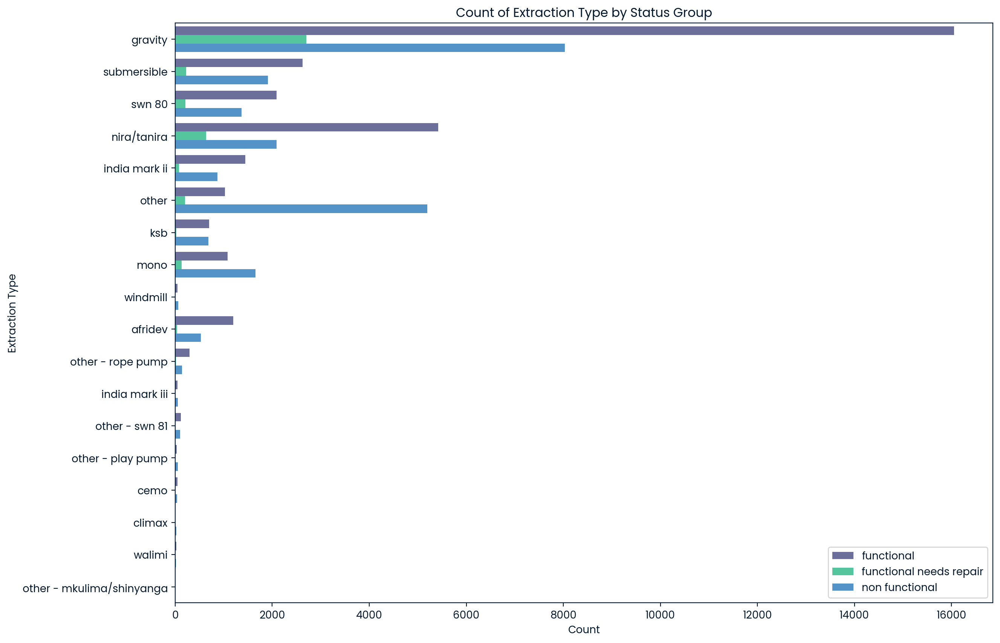

In [55]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'extraction_type' colored by 'status_group'
sns.countplot(data=train_df, y='extraction_type', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Extraction Type by Status Group')
plt.xlabel('Count')
plt.ylabel('Extraction Type')
plt.legend(loc='lower right')

# Show the plot
plt.show()

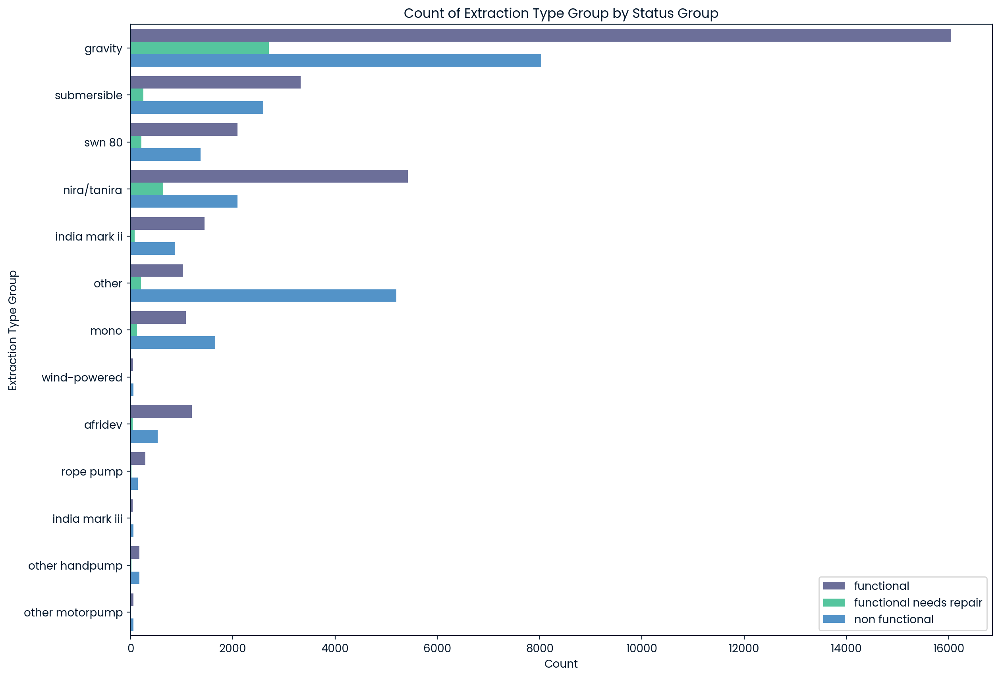

In [56]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'extraction_type_group' colored by 'status_group'
sns.countplot(data=train_df, y='extraction_type_group', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Extraction Type Group by Status Group')
plt.xlabel('Count')
plt.ylabel('Extraction Type Group')
plt.legend(loc='lower right')

# Show the plot
plt.show()

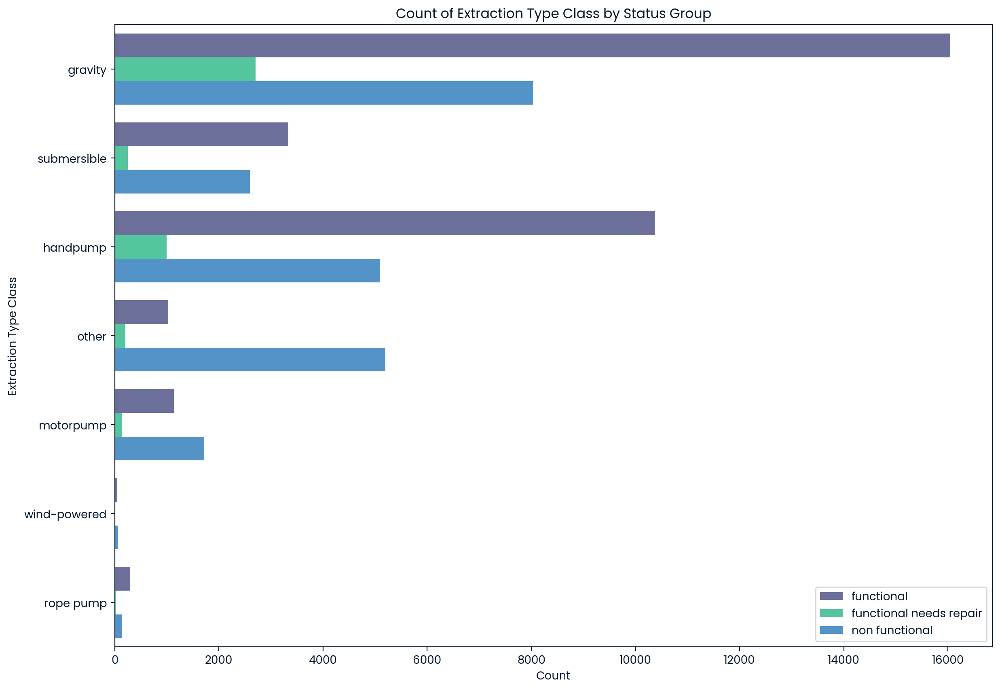

In [57]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'extraction_type_class' colored by 'status_group'
sns.countplot(data=train_df, y='extraction_type_class', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Extraction Type Class by Status Group')
plt.xlabel('Count')
plt.ylabel('Extraction Type Class')
plt.legend(loc='lower right')

# Show the plot
plt.show()

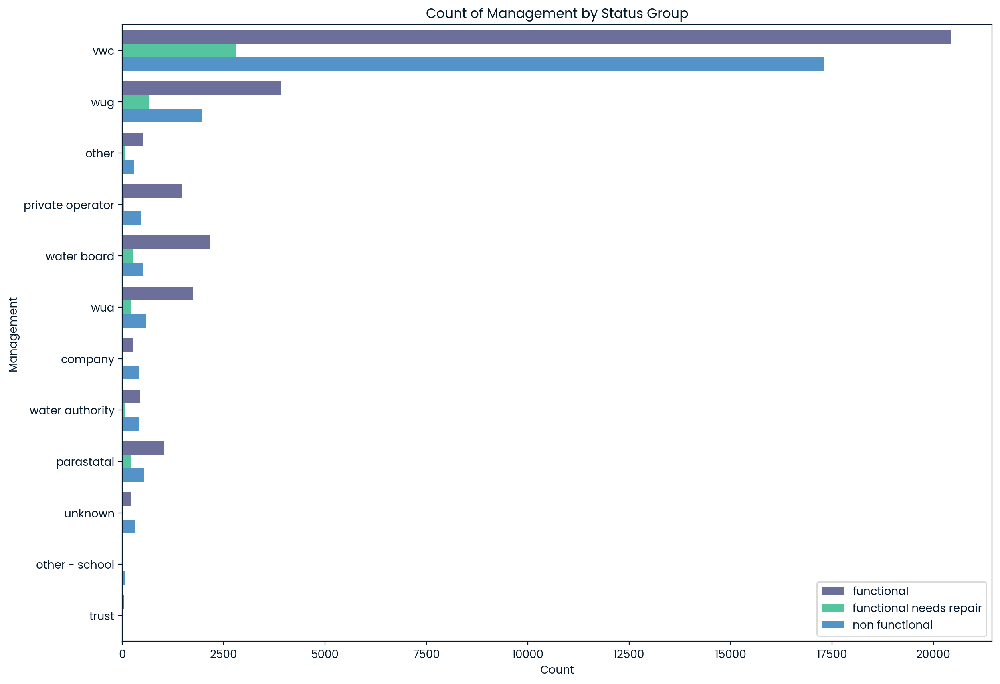

In [58]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'management' colored by 'status_group'
sns.countplot(data=train_df, y='management', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Management by Status Group')
plt.xlabel('Count')
plt.ylabel('Management')
plt.legend(loc='lower right')

# Show the plot
plt.show()

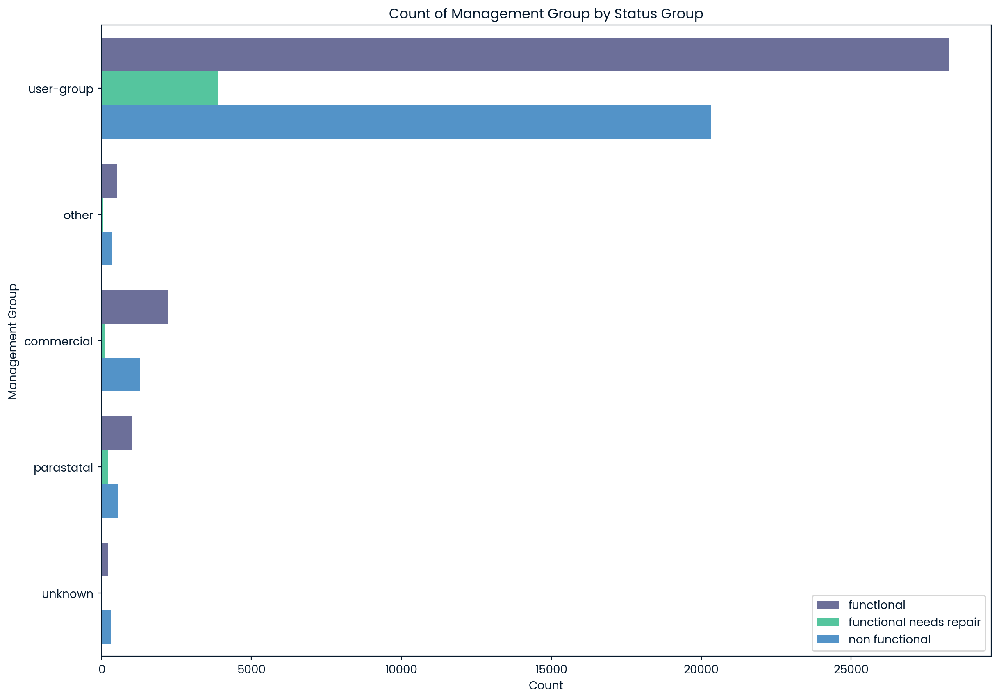

In [59]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create a count plot for 'management_group' colored by 'status_group'
sns.countplot(data=train_df, y='management_group', hue='status_group', hue_order=status_order)

# Set the title and labels
plt.title('Count of Management Group by Status Group')
plt.xlabel('Count')
plt.ylabel('Management Group')
plt.legend(loc='lower right')

# Show the plot
plt.show()

### Additional Features
- `payment` - What the water costs
- `payment_type` - What the water costs
- `water_quality` - The quality of the water
- `quality_group` - The quality of the water
- `quantity` - The quantity of water
- `quantity_group` - The quantity of water
- `source` - The source of the water
- `source_type` - The source of the water
- `source_class` - The source of the water
- `waterpoint_type` - The kind of waterpoint
- `waterpoint_type_group` - The kind of waterpoint

In [60]:
# Create a function
def feature_countplot(data, feature, hue, hue_order=None, top_n=None):
    """
    Creates a countplot for a specified feature, handling NaN values and limiting to top N categories if specified.

    Parameters:
    data (pd.DataFrame): The DataFrame containing the data.
    feature (str): The feature to create the countplot for.
    hue (str): The feature for color coding the plot.
    hue_order (list): The order of the hue categories.
    top_n (int, optional): The number of top categories to display.
    """
    # Set the figure size
    plt.figure(figsize=(14, 10))

    # Handle NaN values
    feature_nan = f'{feature}_nan'
    data[feature_nan] = data[feature].fillna('na')

    if top_n:
        # Get the top N categories by count
        top_categories = data[feature_nan].value_counts().nlargest(top_n).index

        # Filter the dataframe to include only the top N categories
        filtered_data = data[data[feature_nan].isin(top_categories)]
    else:
        filtered_data = data

    # Create the countplot
    sns.countplot(data=filtered_data, y=feature_nan, hue=hue, hue_order=hue_order)

    # Set the title and labels
    title = f'Count of {feature.replace("_", " ").title()} by {hue.replace("_", " ").title()}'
    if top_n:
        title += f' (Top {top_n} Categories Including NaN Values)'
    plt.title(title)
    plt.xlabel('Count')
    plt.ylabel(feature.replace("_", " ").title())
    plt.legend(loc='lower right')

    # Show the plot
    plt.show()

# Example usage:
# Assuming train_df is your DataFrame and status_order is defined
# feature_countplot(train_df, 'extraction_type', 'status_group', hue_order=status_order)
# feature_countplot(train_df, 'scheme_name', 'status_group', hue_order=status_order, top_n=20)

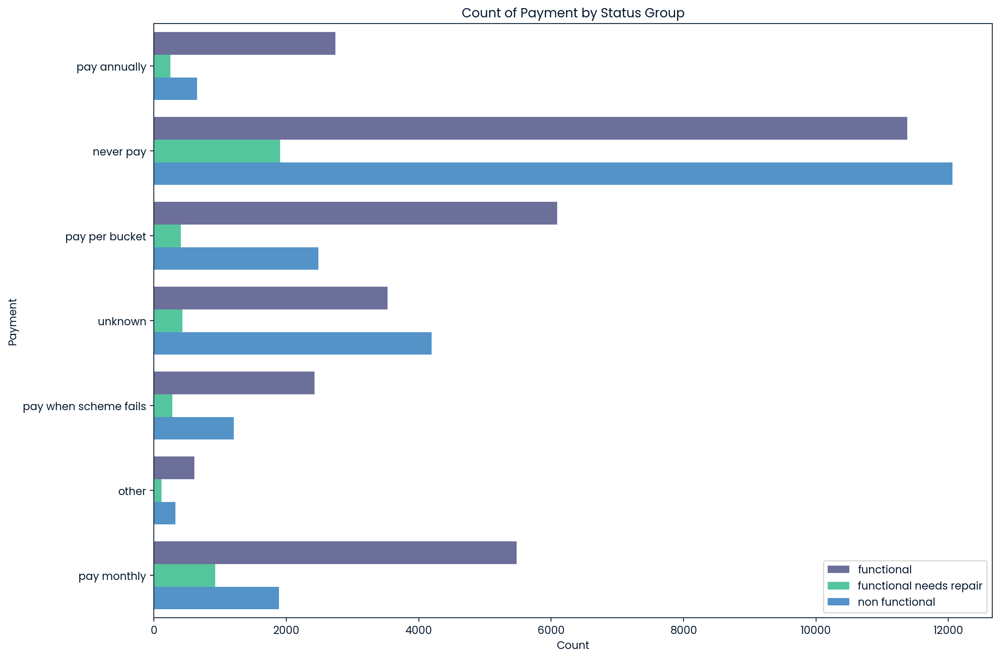

In [61]:
# Payment
feature_countplot(train_df, 'payment', 'status_group', hue_order=status_order, top_n=None)

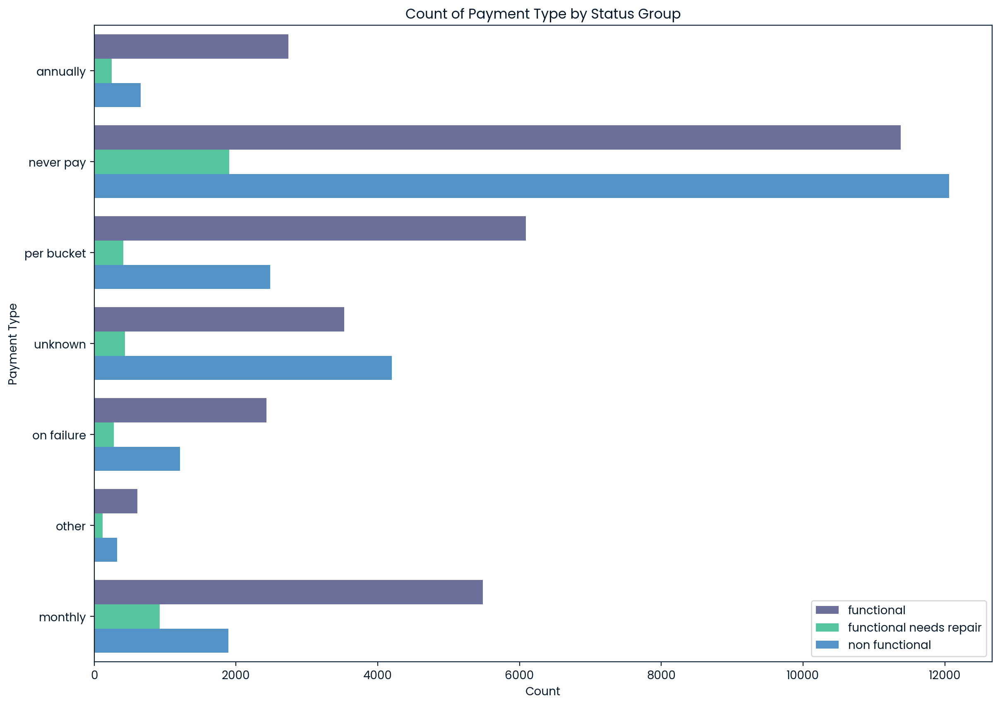

In [62]:
# Payment Type
feature_countplot(train_df, 'payment_type', 'status_group', hue_order=status_order, top_n=None)

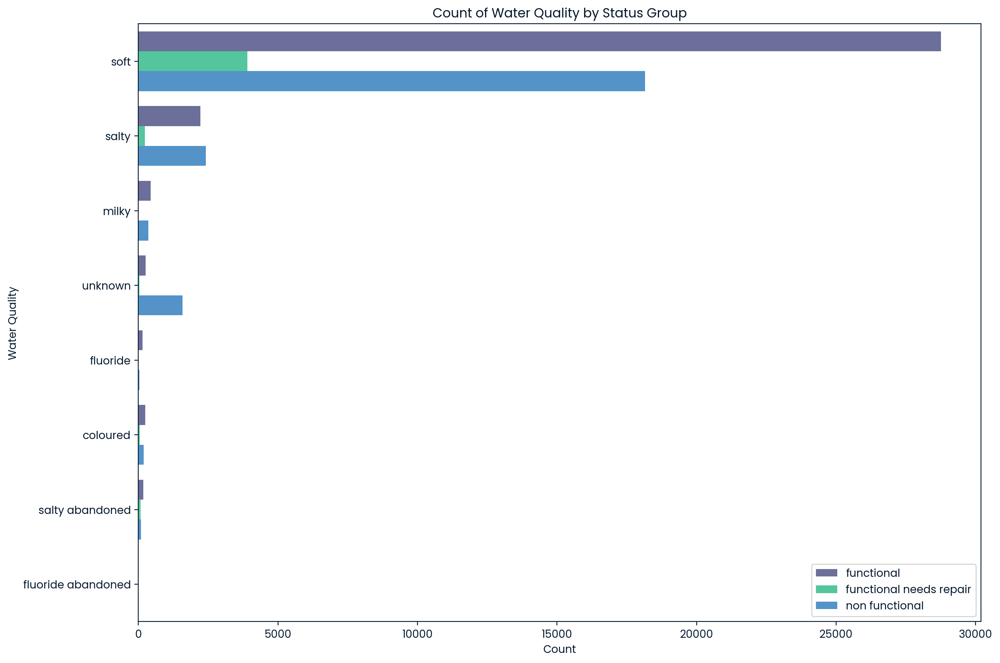

In [63]:
# Water Quality
feature_countplot(train_df, 'water_quality', 'status_group', hue_order=status_order, top_n=None)

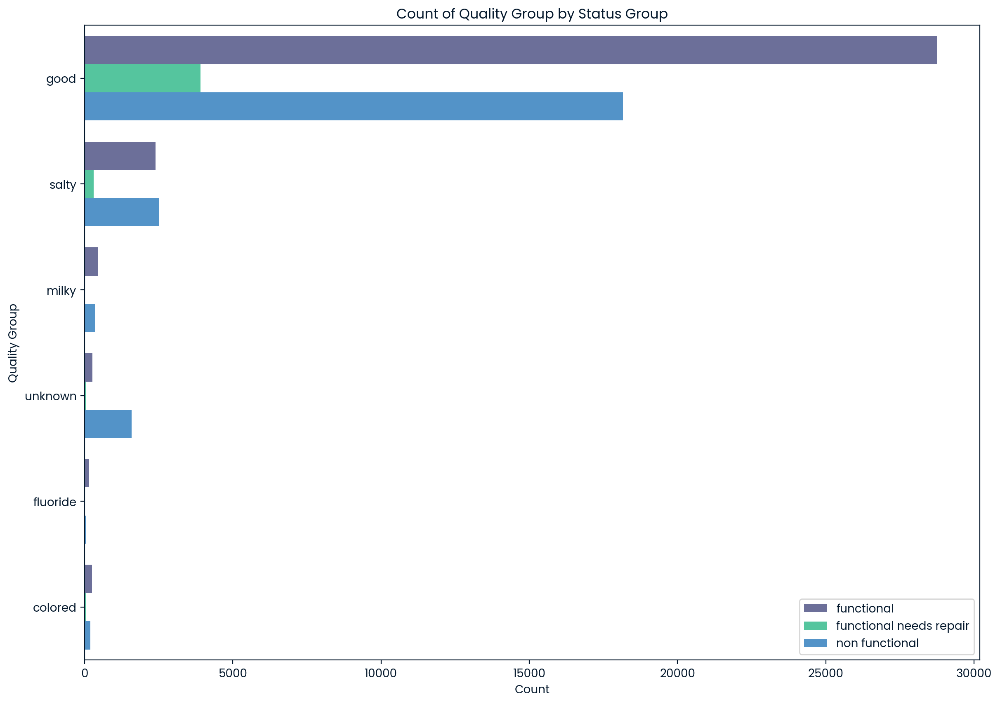

In [64]:
# Quality Group
feature_countplot(train_df, 'quality_group', 'status_group', hue_order=status_order, top_n=None)

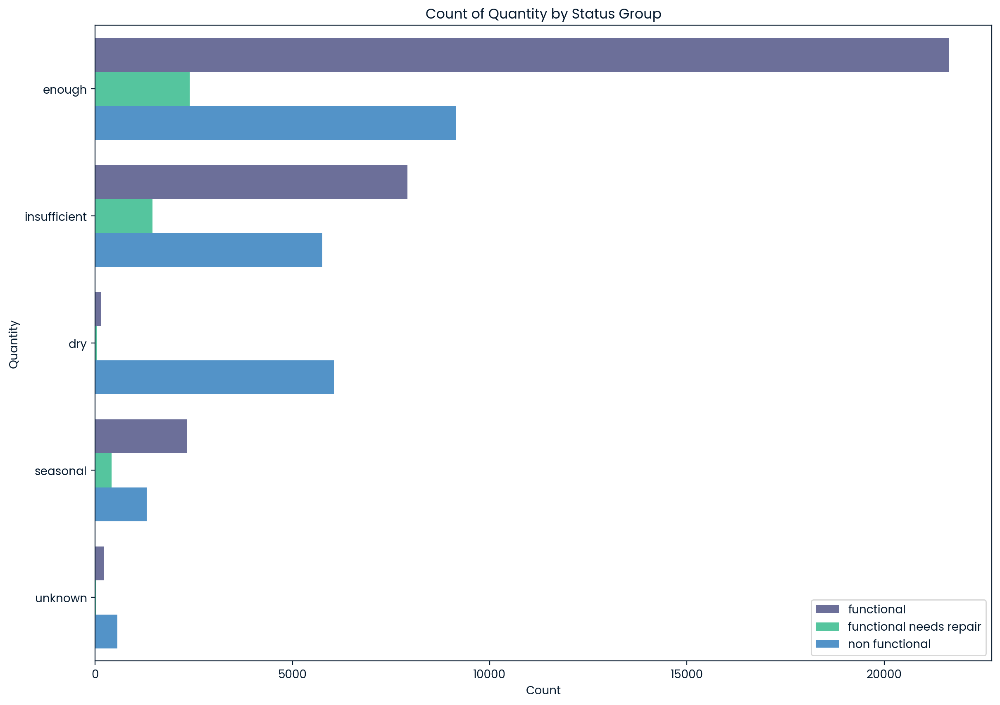

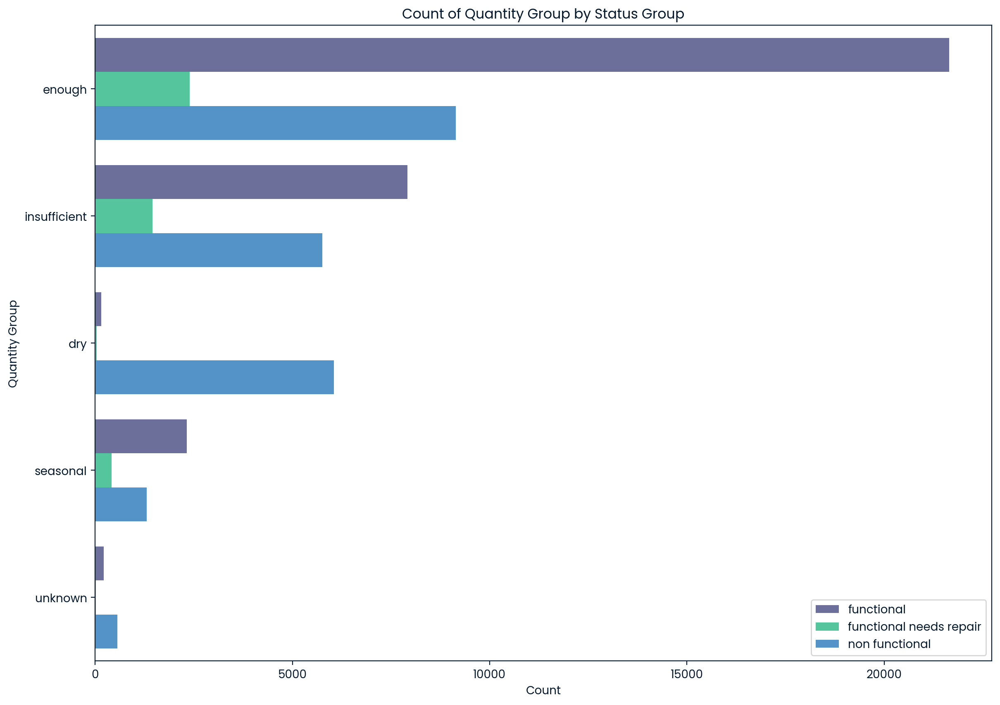

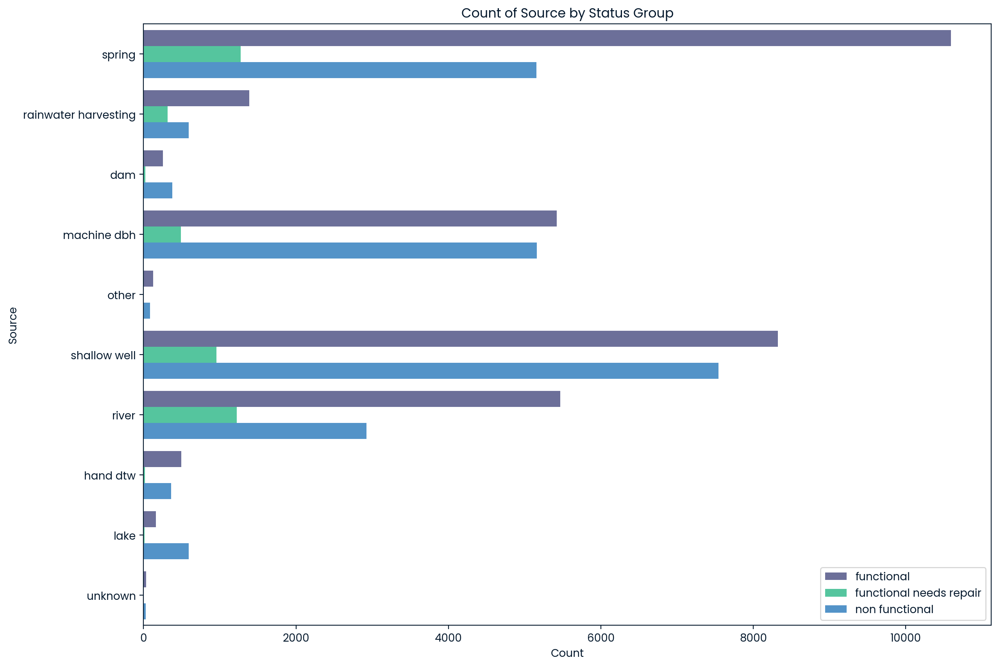

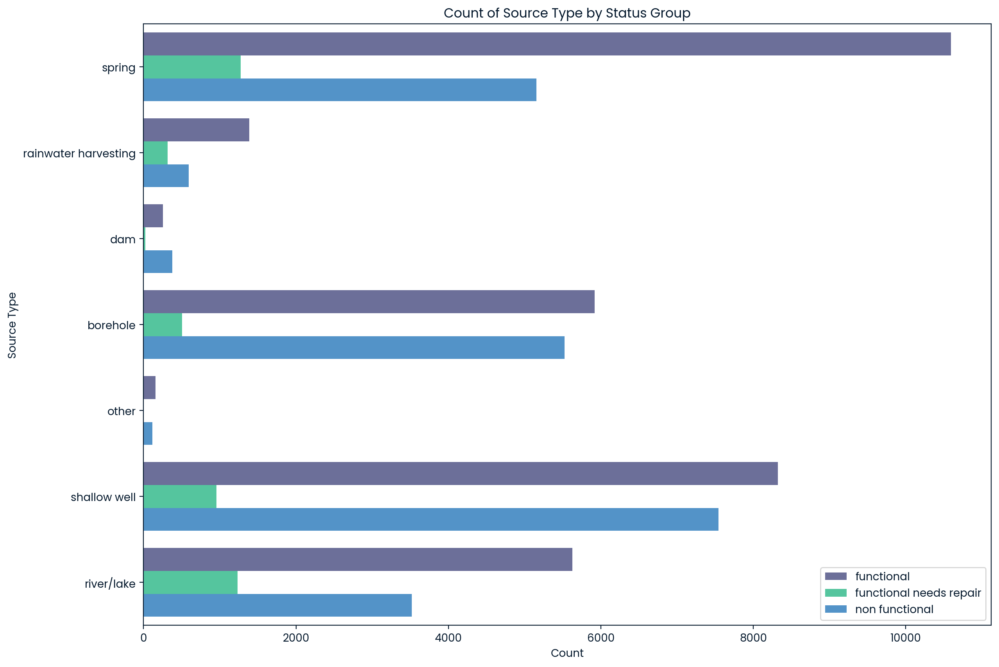

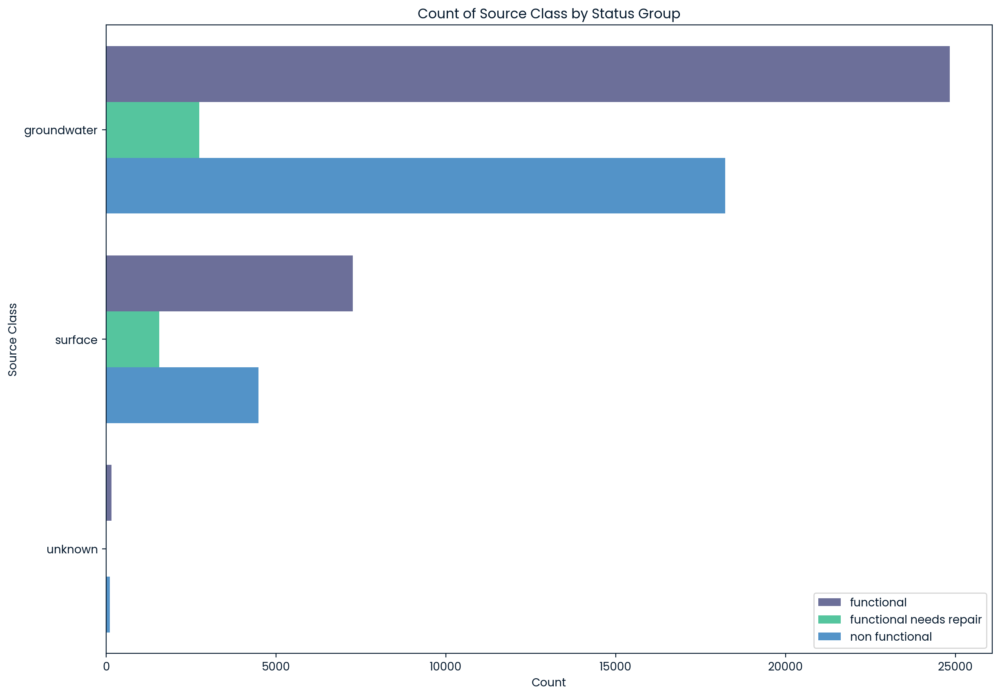

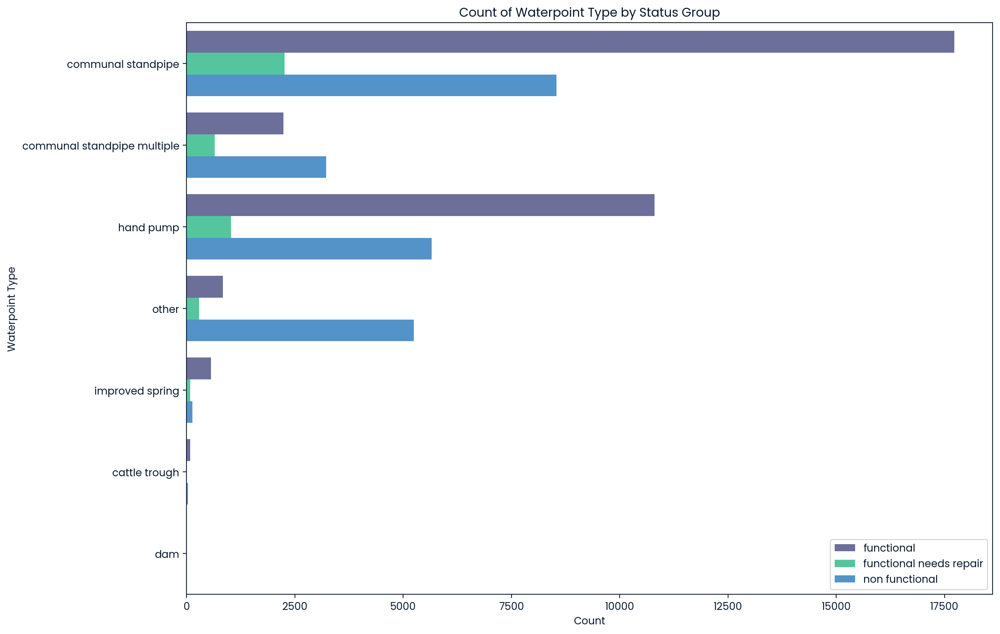

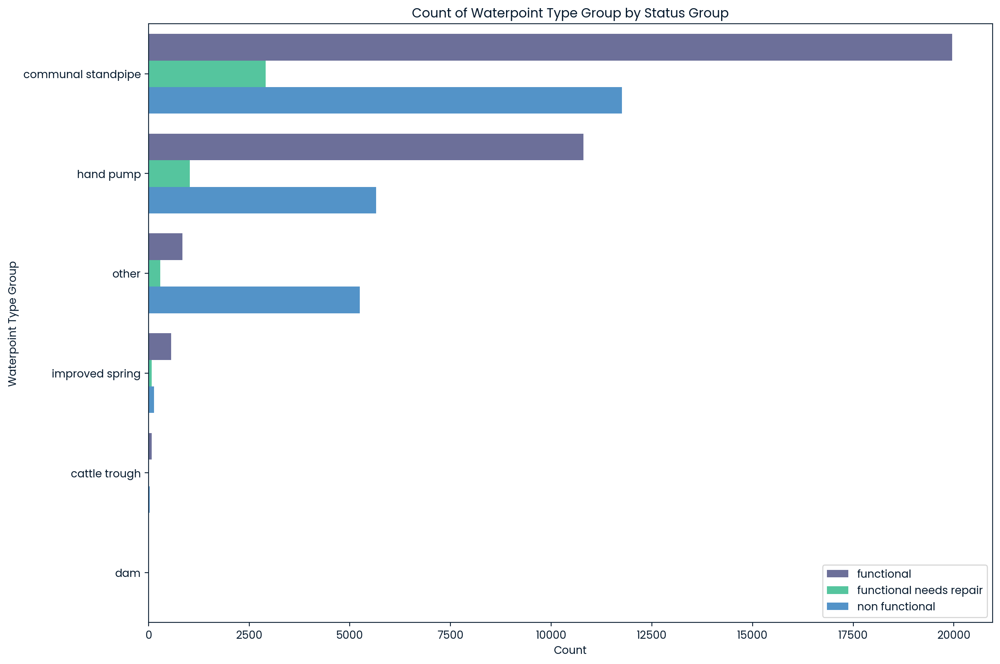

In [65]:
final_features = ['quantity', 'quantity_group',
                  'source', 'source_type', 'source_class',
                  'waterpoint_type', 'waterpoint_type_group']

for feature in final_features:
    feature_countplot(train_df, feature, 'status_group', hue_order=status_order, top_n=None)

# EDA Summary:

- No duplicated rows
- 8 features with missing values (`scheme_name` is 35% missing)

#### Target Variable
- `status_group` - Target Variable (3 categories)
	- Consider preprocessing for class imbalance

## Changes Needed

#### Dropped Features
- `num_private` -
	- Can drop from dataset
- `recorded_by` - Group entering this row of data
	- All the same company; drop feature

#### Numeric Features
- `amount_tsh` - Total static head (amount water available to waterpoint)
	- Log transformation is appropriate (try log10 first. log1p is also fine)
- `population` - Population around the well
	- np.log1p transformation looks great

#### Date Features
- `date_recorded` - The date the row was entered
	- Convert to pd.datetime(); likely can drop feature
- `construction_year` - Year the waterpoint was constructed
	- ~35% of values have year = 0; consider turning into categorical

### Categorical Features
- `funder` - Who funded the well
	- Includes na and 0 values: combine with 0
- `gps_height` - Altitude of the well
	- Looks fairly balanced between `status_groups`; no change needed
- `installer` - Organization that installed the well
	- Includes na and 0 values: combine with 0
- `longitude` - GPS coordinate
	- Some 0 values (which would not exist in Tanzania)
	- Perhaps it's best to leave as all missing values have the same value
- `latitude` - GPS coordinate
	- Refer to longitude
- `wpt_name` - Name of the waterpoint if there is one
	- Most common value is 'none'
	- Convert missing values to 'unknown' (only 2)
- `subvillage` - Geographic location
	- Some categories as single letters or numbers. Rename missing values to 'unknown'
- `region_code` - Geographic location (coded)
	- Convert to categorical
- `district_code` - Geographic location (coded)
	- Convert to categorical
- `public_meeting` - True/False
	- Has missing values; convert to 'unknown' (boolean)
- `scheme_management` - Who operates the waterpoint
	- Convert missing values to 'unknown'
- `scheme_name` - Who operates the waterpoint
	- Convert missing values to 'unknown'
- `permit` - If the waterpoint is permitted
	- Convert missing values to 'unknown' (boolean)

### No Changes Needed (Categorical Features)
- `basin` - Geographic water basin
- `region` - Geographic location
- `lga` - Geographic location
- `ward` - Geographic location
- `extraction_type` - The kind of extraction the waterpoint uses
- `extraction_type_group` - The kind of extraction the waterpoint uses
- `management` - How the waterpoint is managed
- `management_group` - How the waterpoint is managed
- `payment` - What the water costs
- `payment_type` - What the water costs
- `water_quality` - The quality of the water
- `quality_group` - The quality of the water
- `quantity` - The quantity of water
- `quantity_group` - The quantity of water
- `source` - The source of the water
- `source_type` - The source of the water
- `source_class` - The source of the water
- `waterpoint_type` - The kind of waterpoint
- `waterpoint_type_group` - The kind of waterpoint